# Objectif du notebook 

Date de création : 03/05/2026

Illustration des performances de l'estimateur CS-EVD par comparaison à l'estimation obtenu par déconvolution à l'aide d'un filtre de Wiener. 

L'étude est menée sur la séquence d'émission 144 restreinte aux émissions le long de la fibre. La gamme de fréquence est limitée à la gamme de fréquence $[400, 800]~\text{Hz}$ centrée sur la résonance de la source. 


In [2]:
# %matplotlib notebook

import os
import sys
import numpy as np
import xarray as xr
import pandas as pd
import scipy.signal as sp 
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from scipy.interpolate import interp1d
from scipy.spatial.distance import cdist
from datetime import timedelta, datetime
from scipy.stats import linregress
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [3]:
project_root = os.path.abspath(
    os.path.join(os.path.dirname(os.getcwd()), "..", "..", "..", "..", "..")
)
root_groix_data = os.path.join(project_root, "data", "fiberscope_groix_oct_2025")
root_groix_wav = os.path.join(root_groix_data, "wav")
root_groix_metadata = os.path.join(root_groix_data, "metadata")

root_folder = os.path.join(project_root, "real_data_analysis", "fiberscope_groix")
data_folder = os.path.join(root_folder, "data")
img_folder = os.path.join(root_folder, "img")

sensibility_img_folder = os.path.join(img_folder, "rtf_mfp", "sensibility")

In [4]:
sys.path.append(project_root)
from publication.publication_figure import (
    PubFigure,
    LargeFigure,
    color,
    set_subfigures_abc_labels,
)
from propa.rtf.rtf_utils import D_hermitian_angle_fast, D_euclidian


from real_data_analysis.fiberscope_groix.src.fiberscope_groix_manager import (
    # ActiveFiberscopeManager,
    # PassiveFiberscopeManager,
    BandFilter,
)

from real_data_analysis.fiberscope_groix.src.localisation.rtf.rtf_mfp import (
    RTF_MFP_Processor,
)
from misc import progression_bar
from real_data_analysis.fiberscope_groix.src.localisation.rtf.sensibility.sensibility_study_utils import *

# Étape 1 : sélection d'une sous partie de la séquence

Afin de simplifier l'étude, la séquence est réduite aux émissions comprises entre l'OBS 1 et l'OBS 3 (émissions n°50 à n°170).

In [5]:
# Load GPS dataset for station coordinates
ds_gps = xr.open_dataset(os.path.join(data_folder, "gps.nc"))

# Load arrivals dataset
fpath = os.path.join(
    data_folder,
    f"processed_arrivals.nc",
)
ds_arr = xr.open_dataset(fpath)
df_arr = ds_arr.to_dataframe()

In [6]:
seq_id = 144
df_seq = df_arr.loc[df_arr["sequence_id"] == seq_id]

# Select only pulses emitted between OBS1 and OBS3
pulse_slice = (40, 180)     # Only between OBS1 and OBS3
df_seq = df_seq.loc[df_seq["pulse_id"].between(*pulse_slice)]

root_fig = os.path.join(sensibility_img_folder, f"{seq_id}")
if not os.path.exists(root_fig):
    os.makedirs(root_fig)

In [7]:
print(f"Signal properties for sequence {seq_id}:")
print(f"\tNumber of pulses: {len(df_seq['pulse_id'].unique())}")
print(f"\tSignal type: {df_seq['signal_type'].iloc[0]}")
print(f"\tMinimum frequency: {df_seq['frequency_min_hz'].iloc[0]} Hz")
print(f"\tMaximum frequency: {df_seq['frequency_max_hz'].iloc[0]} Hz")
print(f"\tSignal duration: {df_seq['duration_s'].iloc[0]} seconds")
print(f"\tRepeat period: {df_seq['repeat_period_s'].iloc[0]} seconds")


Signal properties for sequence 144:
	Number of pulses: 141
	Signal type: chirp
	Minimum frequency: 80.0 Hz
	Maximum frequency: 1000.0 Hz
	Signal duration: 5.0 seconds
	Repeat period: 8.0 seconds


# Étape 2 : calcul du vecteur de RTFs
Le vecteur de RTF est estimé pour chaque position de la source à l'aide de la méthode CS-EVD et par déconvolution. 

## Définition des paramètres du processeur

In [8]:
root_data = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data"
root_img = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\img\rtf_mfp"
ref_rcv_id = 2
rtf_estimator = "cs-evd"

tau_ir_hat = 0.2  # estimated impulse response duration from sequence 144
tau_ir_hat *= 2  # To ensure we include the entire response


fsm_active_kwargs = {
    "bandfilter": None,
    "tau_ir": tau_ir_hat,
    "process_pulse_one_by_one": True,
    "estimate_ir_duration": False,
}
fsm_passive_kwargs = {
    "analysis_segment_duration": 5,
    "analysis_segment_alpha_overlap": 0,
}

fsm_props = {
    "fs": 2000,
    # "tau_rtf_analysis": 3,
    # "alpha_overlap": 0.5,
    # From the sensibility study
    "tau_rtf_analysis": 8.1,
    "alpha_overlap": 0.95,
}

rtf_mfp_processor = RTF_MFP_Processor(
    root_data=root_data,
    root_img=root_img,
    reference_receiver_id=ref_rcv_id,
    rtf_estimator=rtf_estimator,
    fsm_props=fsm_props,
    fsm_active_kwargs=fsm_active_kwargs,
    fsm_passive_kwargs=fsm_passive_kwargs,
    mode="overwrite",
    plot_replicas_features=False,
    verbose=True,
)

In [9]:
print(rtf_mfp_processor.fsm_nperseg, rtf_mfp_processor.fsm_noverlap)
# fsm_active nperseg and noverlap are only updated when we run the processor
print(rtf_mfp_processor.fsm_active.cm.nperseg, rtf_mfp_processor.fsm_active.cm.noverlap)
print(2**13)

16384 15564
4096 2048
8192


## Calcul des RTFs

In [10]:
###########################
# Dummy
###########################
id_library = 10

active_replicas_args = {
    "replica_sequence_ids": [144],
    "replica_pulse_slice": [pulse_slice],
    "load_precomputed_feature": False,
}
passive_replicas_args = {
    "start_datetimes": [],
    "end_datetimes": [],
    "load_precomputed_feature": False,
}

rtf_mfp_processor.compute_library(
    active_feature_args=active_replicas_args,
    passive_feature_args=passive_replicas_args,
    id=id_library,
)


Deriving features for active source...

RTF processing of sequences [144] (nb of sequences = 1)
Progress: ████████████████████████████████████████████████████████████████████████████████████████████████████ 100%
RTF feature estimation for sequence 144
Progress: ████████████████████████████████████████████████████████████████████████████████████████████████████ 100%
Deriving replicas for passive source...
A library dataset with ID 10 already exists in C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\library. This library dataset will be overwritten.
Dataset (library) saved at C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\library\library_10.nc.


In [11]:
print(rtf_mfp_processor.fsm_active.cm.nperseg, rtf_mfp_processor.fsm_active.cm.noverlap)
print(2**13)

16384 15564
8192


## Chargement des données 

In [12]:
# Select frequency range
fmin = 400
fmax = 800

In [13]:
fpath = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\library\library_10.nc"
ds = xr.open_dataset(fpath)
ds

<xarray.Dataset> Size: 51MB
Dimensions:           (h_index: 3, f_rtf: 8193, replica_id: 141, f_deconv: 5401)
Coordinates:
  * h_index           (h_index) int64 24B 1 2 3
  * f_rtf             (f_rtf) float32 33kB 0.0 0.1221 0.2441 ... 999.9 1e+03
  * replica_id        (replica_id) int64 1kB 0 1 2 3 4 5 ... 136 137 138 139 140
  * f_deconv          (f_deconv) float32 22kB 0.0 0.1852 0.3703 ... 999.7 999.9
Data variables:
    rtf_amp           (h_index, f_rtf, replica_id) float32 14MB ...
    rtf_phase         (h_index, f_rtf, replica_id) float32 14MB ...
    rtf_amp_deconv    (h_index, f_deconv, replica_id) float32 9MB ...
    rtf_phase_deconv  (h_index, f_deconv, replica_id) float32 9MB ...
    feature_psd       (f_rtf, replica_id) float32 5MB ...
    e_replica         (replica_id) float32 564B ...
    n_replica         (replica_id) float32 564B ...
    u_replica         (replica_id) float32 564B ...
    replica_type      (replica_id) int64 1kB ...
Attributes: (12/16)
    reference_receiver_id:  2
    rtf_estimator:          cs-evd
    replica_type_1:         active
    replica_type_2:         passive
    description:            Library dataset containing RTF-MFP features for a...
    type:                   library
    ...                     ...
    obs2_n_apriori:         0.0
    obs2_u_apriori:         0.0
    obs3_e_apriori:         418.25417297268984
    obs3_n_apriori:         850.5744968832777
    obs3_u_apriori:         -7.991059774156952
    id:                     10

In [14]:
fig_folder = os.path.join(sensibility_img_folder, "144", f"library_{ds.id}")
os.makedirs(fig_folder, exist_ok=True)

In [15]:
fpath = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\data\sequences\active\sequence_144_rtf.nc"
ds_sig = xr.open_dataset(fpath)
ds_sig

<xarray.Dataset> Size: 202MB
Dimensions:                     (h_index: 3, time: 2272470, pulse_id: 141,
                                 t_ir: 10801, f_ir: 5401, f_rtf: 8193,
                                 f_csdm: 8193, h_index_bis: 3)
Coordinates:
  * h_index                     (h_index) int64 24B 1 2 3
  * time                        (time) float32 9MB 0.0 0.0005 ... 1.136e+03
  * pulse_id                    (pulse_id) int32 564B 40 41 42 ... 178 179 180
  * t_ir                        (t_ir) float32 43kB 0.0 0.0005 ... 5.399 5.4
  * f_ir                        (f_ir) float32 22kB 0.0 0.1852 ... 999.7 999.9
  * f_rtf                       (f_rtf) float32 33kB 0.0 0.1221 ... 999.9 1e+03
  * f_csdm                      (f_csdm) float32 33kB 0.0 0.1221 ... 999.9 1e+03
  * h_index_bis                 (h_index_bis) int64 24B 1 2 3
Data variables:
    signal                      (h_index, time) float32 27MB ...
    arr_time_in_sec_from_start  (h_index, pulse_id) float32 2kB ...
    ri_hat                      (h_index, t_ir, pulse_id) float32 18MB ...
    tf_hat_amp                  (h_index, f_ir, pulse_id) float32 9MB ...
    tf_hat_phase                (h_index, f_ir, pulse_id) float32 9MB ...
    rtf_amp_hat                 (h_index, f_rtf, pulse_id) float32 14MB ...
    rtf_phase_hat               (h_index, f_rtf, pulse_id) float32 14MB ...
    Rx                          (f_csdm, h_index, h_index_bis, pulse_id) float32 42MB ...
    Rv                          (f_csdm, h_index, h_index_bis, pulse_id) float32 42MB ...
    rtf_amp                     (h_index, f_ir, pulse_id) float32 9MB ...
    rtf_phase                   (h_index, f_ir, pulse_id) float32 9MB ...
Attributes: (12/17)
    fs:                        2000
    ts:                        0.0005
    t0:                        5.0
    t1:                        6.226
    datetime_format:           %Y-%m-%d_%H-%M-%S
    start_datetime:            2025-10-16_10-56-25
    ...                        ...
    inter_pulse_period:        8.0
    process_pulse_one_by_one:  1
    root_img:                  C:\Users\baptiste.menetrier\Desktop\devPy\phd\...
    root_data:                 C:\Users\baptiste.menetrier\Desktop\devPy\phd\...
    h_index_ref:               2
    pulse_window_length_s:     10.04

## Illustration de la donnée d'entrée 

### Position de la source le long de la trajectoire 

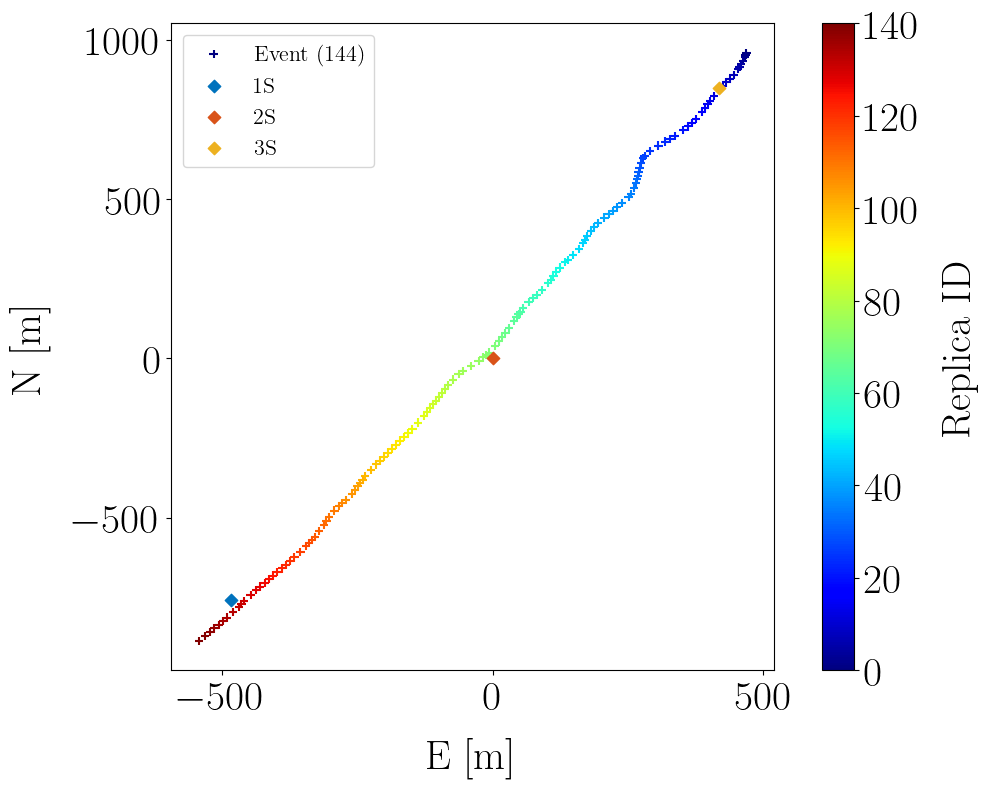

In [16]:
root_img_traj = os.path.join(fig_folder, "trajectory")
os.makedirs(root_img_traj, exist_ok=True)
plot_seq_replica_positions(df_seq, ds_gps, root_fig=root_img_traj)

### Vitesse du porteur au cours de la trajectoire 

Median source speed along traj : vs = 1.83 m.s-1
Std source speed along traj : vs = 0.35 m.s-1


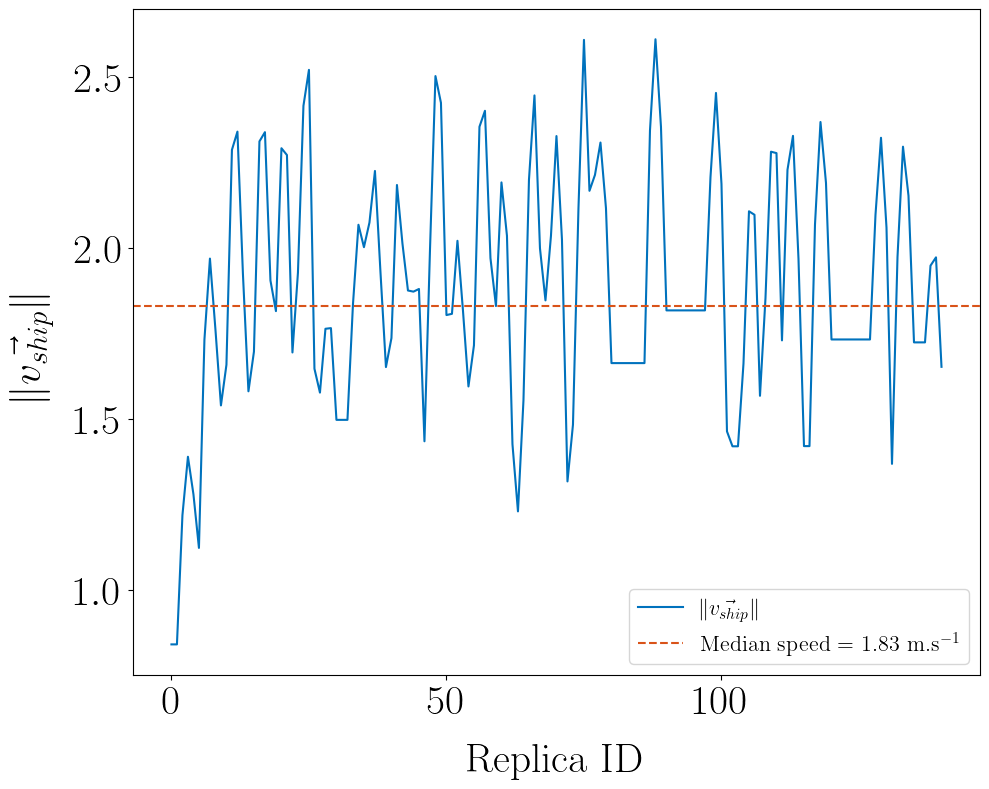

In [17]:
plot_speed_along_seq(df_seq, root_fig=root_img_traj)

### Données des OBS 

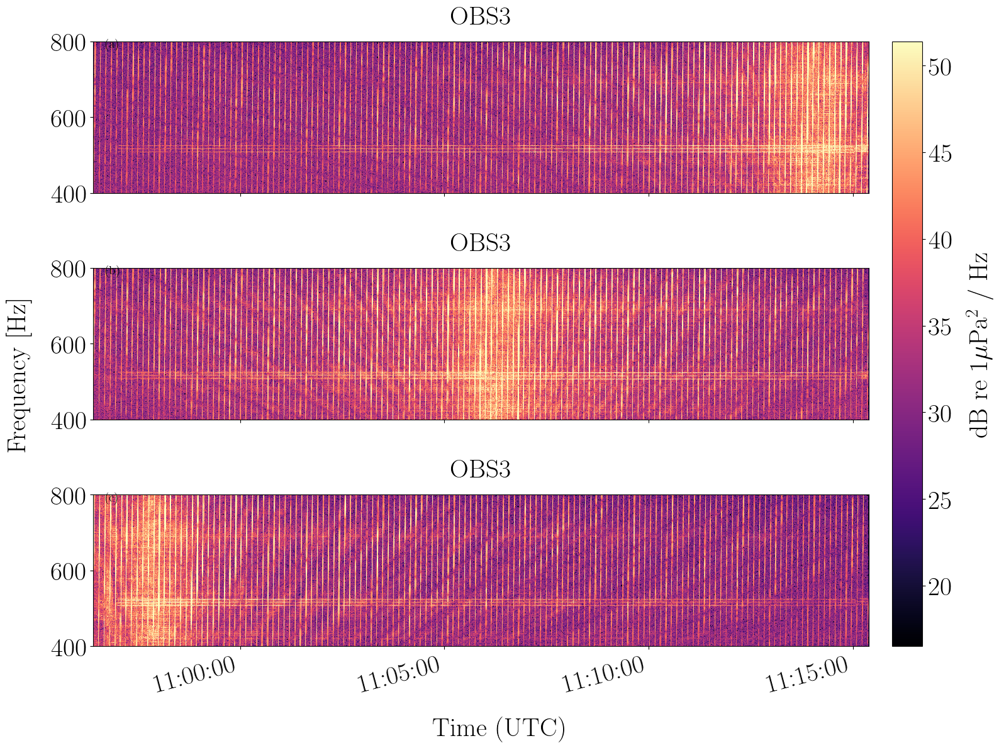

In [18]:
# Load wav data and plot the corresponding sequence
ds_wav = xr.open_dataset(os.path.join(data_folder, "channel_H_wav.nc"))

plot_sequence_spectrogram(
    ds_sig,
    ds_wav,
    fig_folder,
    nperseg=2**12,
    noverlap=2**11,
    fmin=fmin,
    fmax=fmax,
    fname="sequence_signal_spectrogram.png",
)

On peut clairement distinguer le passage du porteur au CPA des trois OBS au cours de la trajectoire. 

# Étape 3 : comparaison des deux estimateurs 

## Interpolation de l'estimation par déconvolution

La résolution en fréquence de l'estimation CS-EVD est plus faible que celle de l'estimation par déconvolution en raison du découpage du signal correspondant à une émission en segment d'analyse STFT de taille réduite. Afin de comparer quantitativement ces deux estimateurs l'estimation par déconvolution, qui possède donc la meilleure résolution, est interpolée aux fréquences de l'estimation CS-EVD. Le vecteur de RTF est complexe et il est donc nécessaire d'interpoler indépendamment le module et la phase. L'interpolation du module ne pose a priori pas de problème spécifique, en revanche un soin particulier doit être apporté à l'interpolation de la phase afin d'éviter les problèmes relatifs aux sauts de phase (phase entre $-\pi$ et $+\pi$). 

Pour ce faire, la phase de l'estimation par déconvolution est d'abord déroulée avant d'être linéairement interpolée. 

### Illustration sur un pulse 

In [19]:
ds = ds.sel(f_rtf=slice(fmin, fmax), f_deconv=slice(fmin, fmax))

freq = ds.f_rtf.values
freq_deconv = ds.f_deconv.values

# Build complex RTFs
rtf_cs_evd = ds.rtf_amp * np.exp(1j * ds.rtf_phase)
rtf_deconvolution = ds.rtf_amp_deconv * np.exp(1j * ds.rtf_phase_deconv)
f, rtf_deconvolution_interp = interp_deconvolution(ds)

In [20]:
ds

<xarray.Dataset> Size: 20MB
Dimensions:           (h_index: 3, f_rtf: 3277, replica_id: 141, f_deconv: 2160)
Coordinates:
  * h_index           (h_index) int64 24B 1 2 3
  * f_rtf             (f_rtf) float32 13kB 400.0 400.1 400.3 ... 799.8 799.9
  * replica_id        (replica_id) int64 1kB 0 1 2 3 4 5 ... 136 137 138 139 140
  * f_deconv          (f_deconv) float32 9kB 400.1 400.3 400.5 ... 799.7 799.9
Data variables:
    rtf_amp           (h_index, f_rtf, replica_id) float32 6MB ...
    rtf_phase         (h_index, f_rtf, replica_id) float32 6MB -2.29 ... 2.637
    rtf_amp_deconv    (h_index, f_deconv, replica_id) float32 4MB 1.272 ... 0...
    rtf_phase_deconv  (h_index, f_deconv, replica_id) float32 4MB 2.877 ... -...
    feature_psd       (f_rtf, replica_id) float32 2MB ...
    e_replica         (replica_id) float32 564B ...
    n_replica         (replica_id) float32 564B ...
    u_replica         (replica_id) float32 564B ...
    replica_type      (replica_id) int64 1kB ...
Attributes: (12/16)
    reference_receiver_id:  2
    rtf_estimator:          cs-evd
    replica_type_1:         active
    replica_type_2:         passive
    description:            Library dataset containing RTF-MFP features for a...
    type:                   library
    ...                     ...
    obs2_n_apriori:         0.0
    obs2_u_apriori:         0.0
    obs3_e_apriori:         418.25417297268984
    obs3_n_apriori:         850.5744968832777
    obs3_u_apriori:         -7.991059774156952
    id:                     10

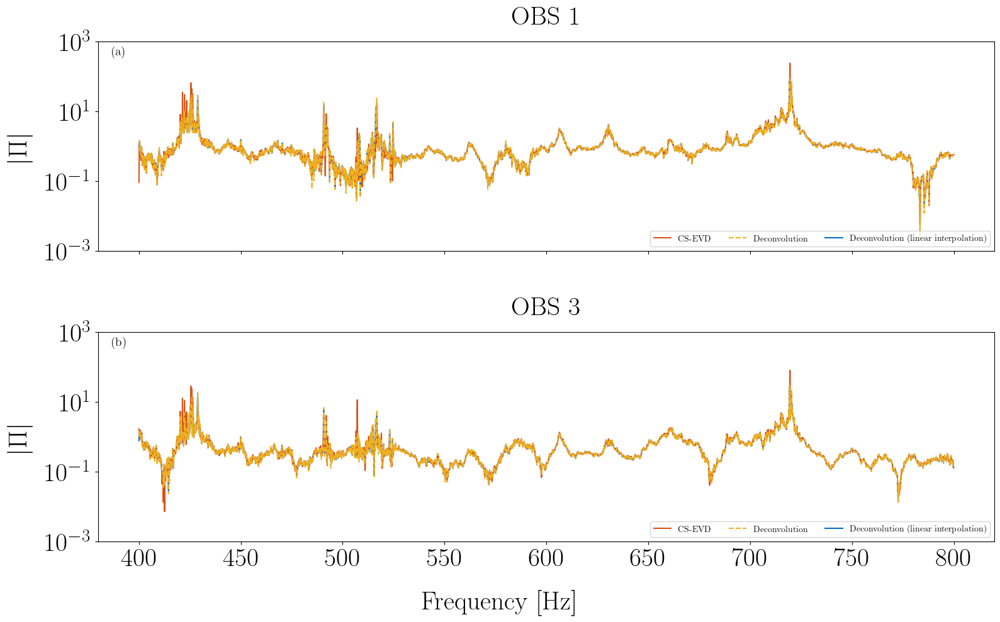

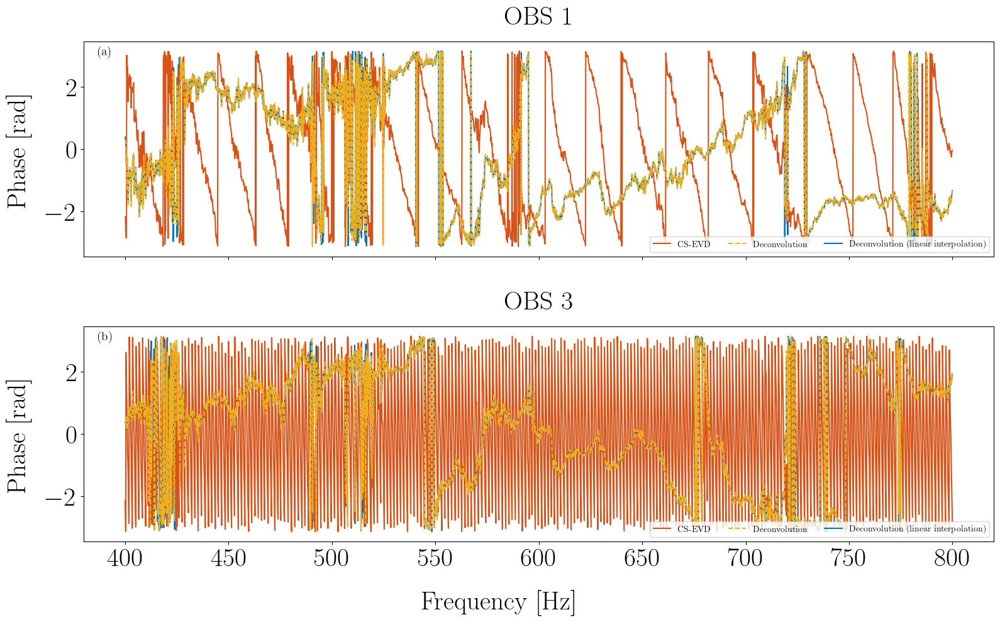

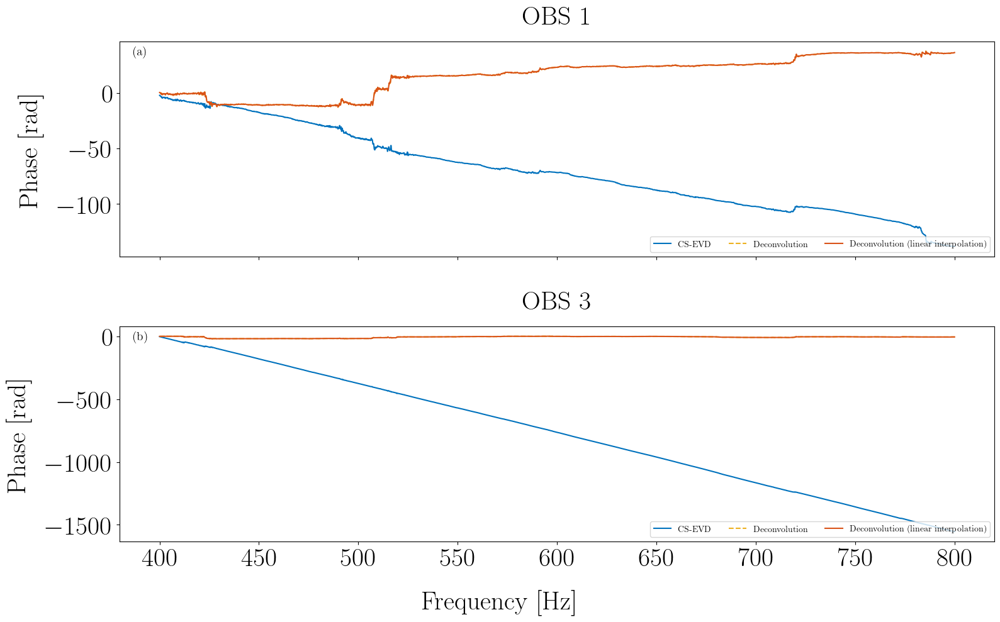

In [21]:
save = True

root_deconv_vs_cs_evd = os.path.join(fig_folder, "deconv_vs_cs_evd", "show_interpolation")
os.makedirs(root_deconv_vs_cs_evd, exist_ok=True)
plot_features_ipulse(
    rtf_cs_evd=rtf_cs_evd,
    rtf_deconvolution_interp=rtf_deconvolution_interp,
    freq=f,
    rcv_ref_id=ds.reference_receiver_id,
    i_pulse=100,
    rtf_deconvolution=rtf_deconvolution,
    freq_deconv=freq_deconv,
    save=save,
    root_img=root_deconv_vs_cs_evd,
)

On peut vérifier que l'interpolation est correcte pour le module et la phase. La phase déroulée, après interpolation est légèrement différente, il s'agit d'un comportement attendu. 

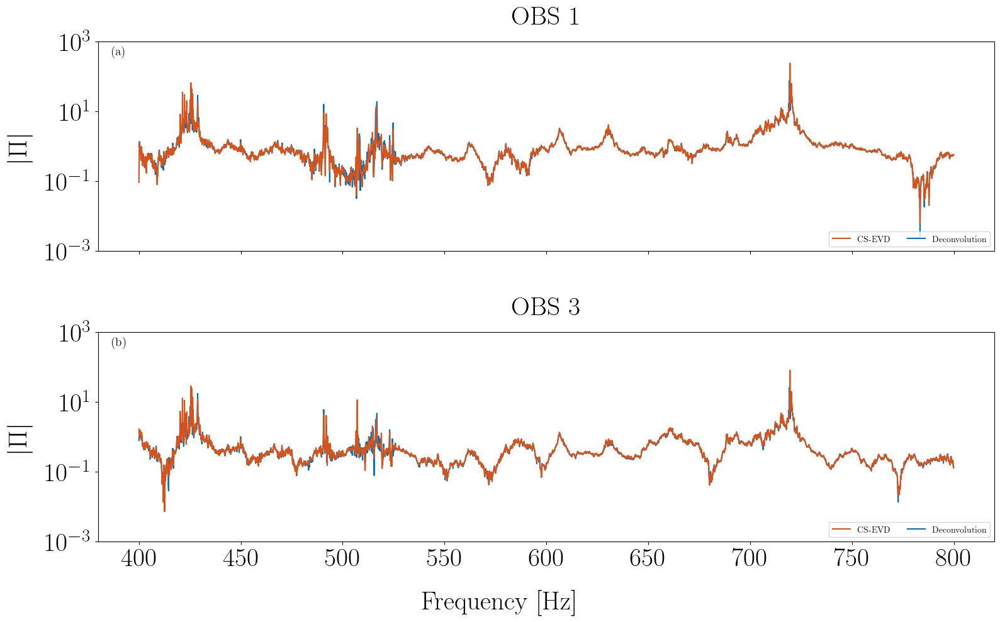

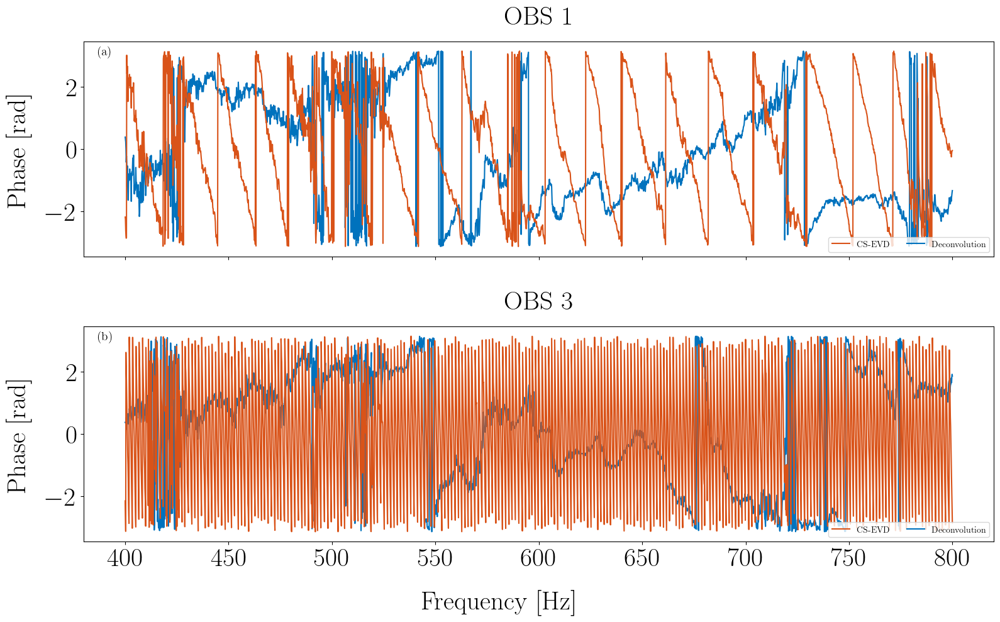

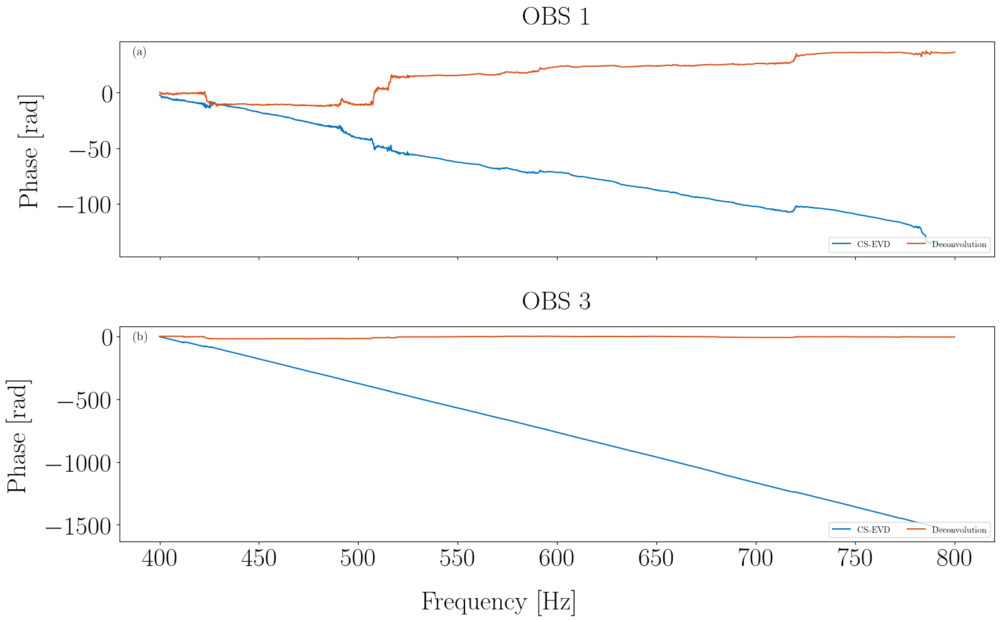

In [22]:
save = True

root_deconv_vs_cs_evd = os.path.join(fig_folder, "deconv_vs_cs_evd")
os.makedirs(root_deconv_vs_cs_evd, exist_ok=True)
plot_features_ipulse(
    rtf_cs_evd=rtf_cs_evd,
    rtf_deconvolution_interp=rtf_deconvolution_interp,
    freq=f,
    rcv_ref_id=ds.reference_receiver_id,
    i_pulse=100,
    rtf_deconvolution=None,
    freq_deconv=freq_deconv,
    save=save,
    root_img=root_deconv_vs_cs_evd,
)

## Application à toute la séquence 

In [23]:
theta, theta_mod, theta_f, d_L1, d_L1_mod, dist_dtw = process_all_pulses(
    freq=f,
    rtf_cs_evd=rtf_cs_evd.values,
    rtf_deconvolution_interp=rtf_deconvolution_interp,
    plot_feature=False,
    use_deconvolution_phase=False,
)

# theta_same_phase, theta_mod, theta_f_same_phase, d_euc_mod, d_euc, dist_dtw = (
#     process_all_pulses(
#         freq=f,
#         rtf_cs_evd=rtf_cs_evd.values,
#         rtf_deconvolution_interp=rtf_deconvolution_interp,
#         plot_feature=False,
#         use_deconvolution_phase=True,
#     )
# )

In [24]:
dist_rcv = get_dist_to_rcv(ds)
obs_cpa_idx = np.argmin(dist_rcv, axis=1).flatten()
reps = ds.replica_id.values

In [25]:
# d_euc_mod = 1 / d_euc_mod
# d_euc = 1/ d_euc
# d_euc_mod_norm = (d_euc_mod - d_euc_mod.min()) / (d_euc_mod.max() - d_euc_mod.min()) * 90
# d_euc_norm = (d_euc - d_euc.min()) / (d_euc.max() - d_euc.min()) * 90
# d_dtw = (dist_dtw - dist_dtw.min()) / (dist_dtw.max() - dist_dtw.min()) * 90

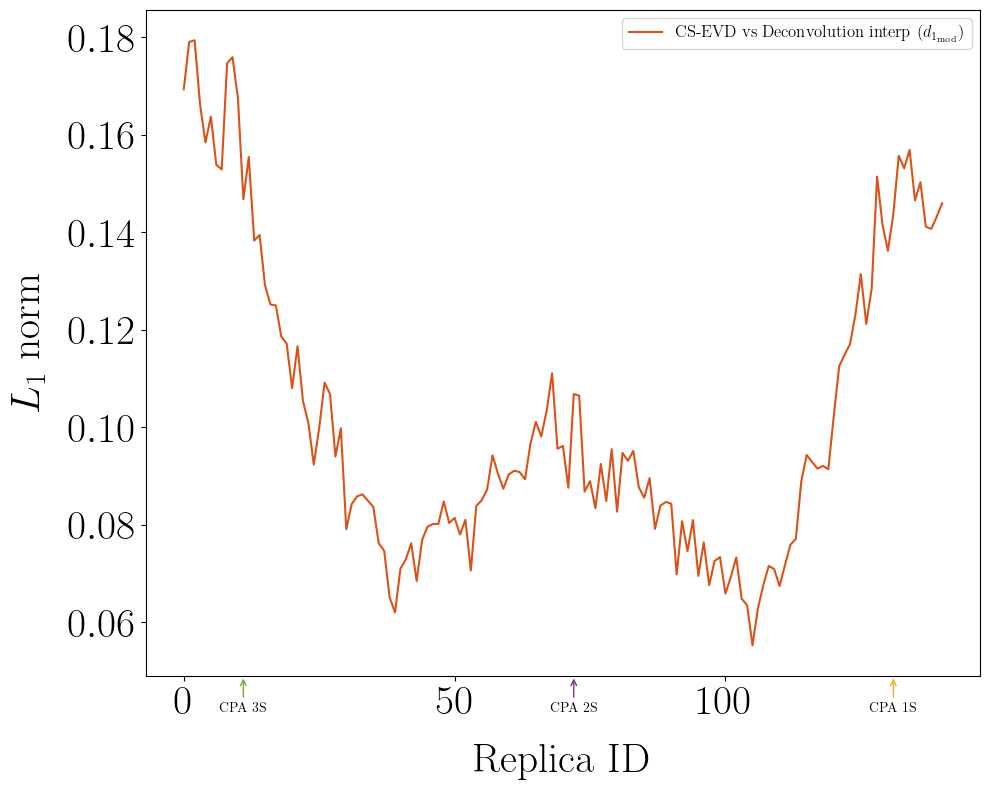

In [26]:
rep_selection = [40, obs_cpa_idx[0], 105]
plt.figure()
# plt.plot(
#     reps,
#     d_L1,
#     label=r"CS-EVD vs Deconvolution interp " + r"$(d_1$)",
#     color=color(0),
#     # linestyle="--",
# )
plt.plot(
    reps,
    d_L1_mod,
    label=r"CS-EVD vs Deconvolution interp " + r"$(d_{1_\text{mod}})$",
    color=color(1),
    # linestyle="--",
)


plt.ylabel(r"$L_1$ norm")
plt.xlabel("Replica ID")
plt.legend(fontsize=12, loc="upper right")

for i_rcv in range(dist_rcv.shape[0]):

    plt.annotate(
        text=f"CPA {i_rcv+1}S",
        xy=(reps[obs_cpa_idx[i_rcv]], plt.gca().get_ylim()[0]),
        xytext=(
            reps[obs_cpa_idx[i_rcv]],
            plt.gca().get_ylim()[0]
            - 0.05 * (plt.gca().get_ylim()[1] - plt.gca().get_ylim()[0]),
        ),
        # arrowprops=dict(arrowstyle="->", color=color(i_rcv + len(rep_selection))),
        arrowprops=dict(arrowstyle="->", color=color(i_rcv + 2)),
        horizontalalignment="center",
        verticalalignment="center",
    )

fpath = os.path.join(fig_folder, "L1_and_L1_mod_vs_replica_id.png")
plt.savefig(fpath)

Theta min = 4.536045551300049°, theta max = 43.385135650634766°
Theta min = 0.22728192806243896°, theta max = 1.2542940378189087°


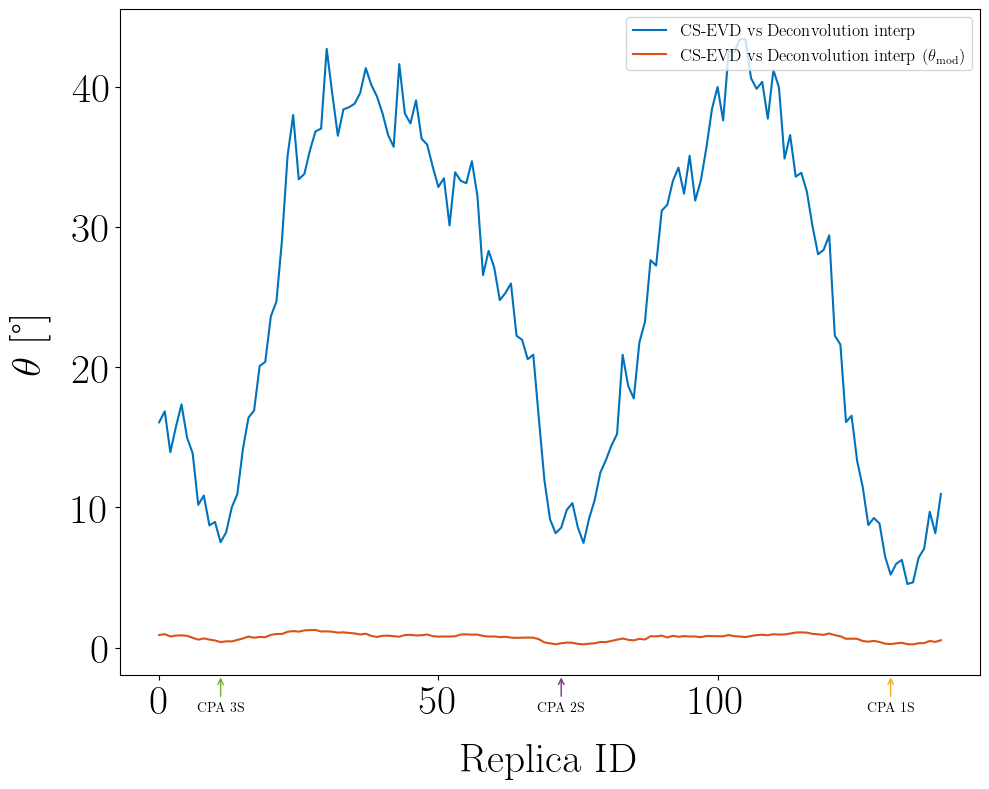

In [27]:
print(f"Theta min = {theta.min()}°, theta max = {theta.max()}°")
print(f"Theta min = {theta_mod.min()}°, theta max = {theta_mod.max()}°")

rep_selection = [40, obs_cpa_idx[0], 105]
plt.figure()
plt.plot(reps, theta, label="CS-EVD vs Deconvolution interp", color=color(0))
plt.plot(
    reps,
    theta_mod,
    label=r"CS-EVD vs Deconvolution interp ($\theta_{\text{mod}}$)",
    color=color(1),
    # linestyle="--",
)

# for i, rep_i in enumerate(rep_selection):
#     plt.axvline(
#         reps[rep_i],
#         color=color(i),
#         label=f"ID = {rep_i}",
#         linestyle="--",
#     )
plt.ylabel(r"$\theta$ [°]")
plt.xlabel("Replica ID")
plt.legend(fontsize=12, loc="upper right")

for i_rcv in range(dist_rcv.shape[0]):

    plt.annotate(
        text=f"CPA {i_rcv+1}S",
        xy=(reps[obs_cpa_idx[i_rcv]], plt.gca().get_ylim()[0]),
        xytext=(
            reps[obs_cpa_idx[i_rcv]],
            plt.gca().get_ylim()[0]
            - 0.05 * (plt.gca().get_ylim()[1] - plt.gca().get_ylim()[0]),
        ),
        # arrowprops=dict(arrowstyle="->", color=color(i_rcv + len(rep_selection))),
        arrowprops=dict(arrowstyle="->", color=color(i_rcv + 2)),
        horizontalalignment="center",
        verticalalignment="center",
    )

fpath = os.path.join(fig_folder, "theta_and_theta_mod_vs_replica_id.png")
plt.savefig(fpath)

L'utilisation du module des RTFs permet de réduire fortement l'angle entre les deux vecteurs. En effet, les deux estimateurs ne coïncident pas en phase. 

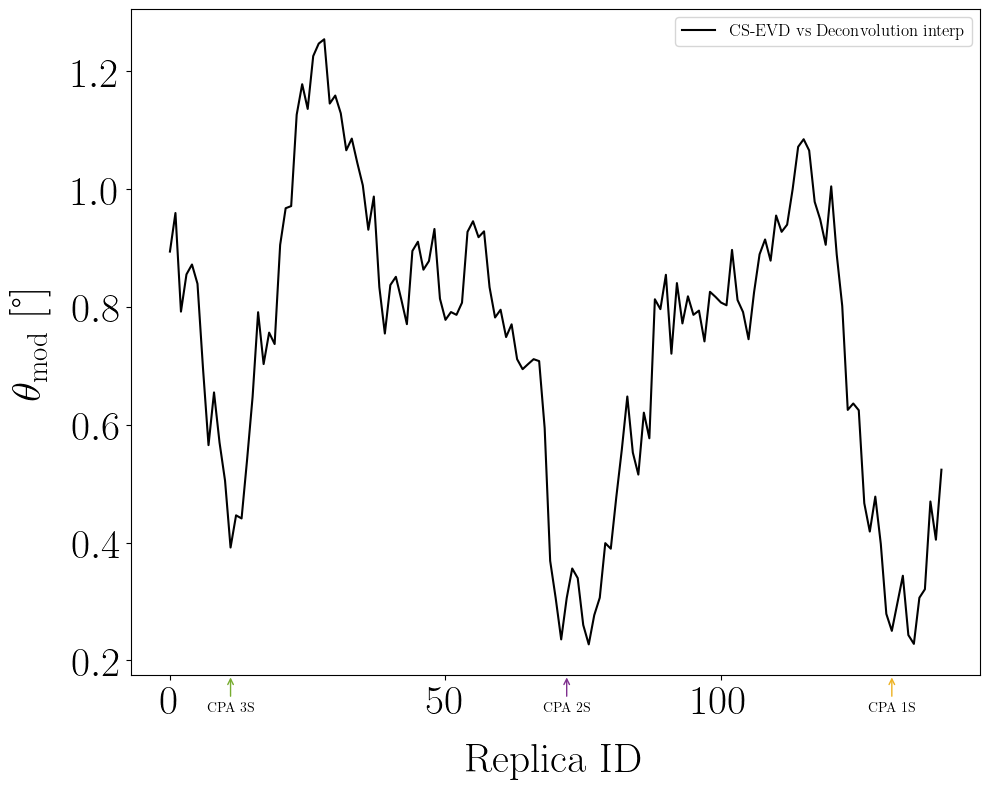

In [28]:
rep_selection = [40, obs_cpa_idx[0], 105]
plt.figure()
plt.plot(
    reps,
    theta_mod,
    label=r"CS-EVD vs Deconvolution interp",
    color="k",
    # linestyle="--",
)

# for i, rep_i in enumerate(rep_selection):
#     plt.axvline(
#         reps[rep_i],
#         color=color(i),
#         label=f"ID = {rep_i}",
#         linestyle="--",
#     )
plt.ylabel(r"$\theta_\text{mod}$ [°]")
plt.xlabel("Replica ID")
plt.legend(fontsize=12, loc="upper right")

for i_rcv in range(dist_rcv.shape[0]):

    plt.annotate(
        text=f"CPA {i_rcv+1}S",
        xy=(reps[obs_cpa_idx[i_rcv]], plt.gca().get_ylim()[0]),
        xytext=(
            reps[obs_cpa_idx[i_rcv]],
            plt.gca().get_ylim()[0]
            - 0.05 * (plt.gca().get_ylim()[1] - plt.gca().get_ylim()[0]),
        ),
        # arrowprops=dict(arrowstyle="->", color=color(i_rcv + len(rep_selection))),
        arrowprops=dict(arrowstyle="->", color=color(i_rcv + 2)),
        horizontalalignment="center",
        verticalalignment="center",
    )

fpath = os.path.join(fig_folder, "theta_mod_vs_replica_id.png")
plt.savefig(fpath)

La distance réduite au module présente tout de même des variations similaires avec des minimums au passage des CPA de chacun des OBS. Ces minimums traduisent le meilleur rapport signal à bruit observé proche des capteurs. Le minimum global est obtenu au CPA de l'OBS de référence = OBS 2. Ainsi, il est important de choisir le capteur de référence comme étant le capteur ou le SNR est le plus élevé. 

In [29]:
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

In [30]:
# Module
q1_err_rel = []
q2_err_rel = []
q3_err_rel = []
q1_err_abs = []
q2_err_abs = []
q3_err_abs = []


i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    q1_err_rel_ircv = []
    q2_err_rel_ircv = []
    q3_err_rel_ircv = []
    q1_err_abs_ircv = []
    q2_err_abs_ircv = []
    q3_err_abs_ircv = []

    for i, i_pulse in enumerate(ds.replica_id.values):

        mod_err = np.abs(
            np.abs(rtf_deconvolution_interp[i_rcv, :, i_pulse])
            - np.abs(rtf_cs_evd[i_rcv, :, i_pulse])
        )
        q1_err = np.percentile(mod_err.values, 25)
        q2_err = np.percentile(mod_err.values, 50)
        q3_err = np.percentile(mod_err.values, 75)
        q1_err_abs_ircv.append(q1_err)
        q2_err_abs_ircv.append(q2_err)
        q3_err_abs_ircv.append(q3_err)

        mod_err_r = mod_err / np.abs(rtf_deconvolution_interp[i_rcv, :, i_pulse])
        # mod_err_r = mod_err / np.abs(rtf_cs_evd[i_rcv, :, i_pulse])

        q1_err_r = np.percentile(mod_err_r.values, 25)
        q2_err_r = np.percentile(mod_err_r.values, 50)
        q3_err_r = np.percentile(mod_err_r.values, 75)
        q1_err_rel_ircv.append(q1_err_r)
        q2_err_rel_ircv.append(q2_err_r)
        q3_err_rel_ircv.append(q3_err_r)

    q1_err_rel.append(q1_err_rel_ircv)
    q2_err_rel.append(q2_err_rel_ircv)
    q3_err_rel.append(q3_err_rel_ircv)
    q1_err_abs.append(q1_err_abs_ircv)
    q2_err_abs.append(q2_err_abs_ircv)
    q3_err_abs.append(q3_err_abs_ircv)


q1_err_rel = np.array(q1_err_rel)
q2_err_rel = np.array(q2_err_rel)
q3_err_rel = np.array(q3_err_rel)
q1_err_abs = np.array(q1_err_abs)
q2_err_abs = np.array(q2_err_abs)
q3_err_abs = np.array(q3_err_abs)

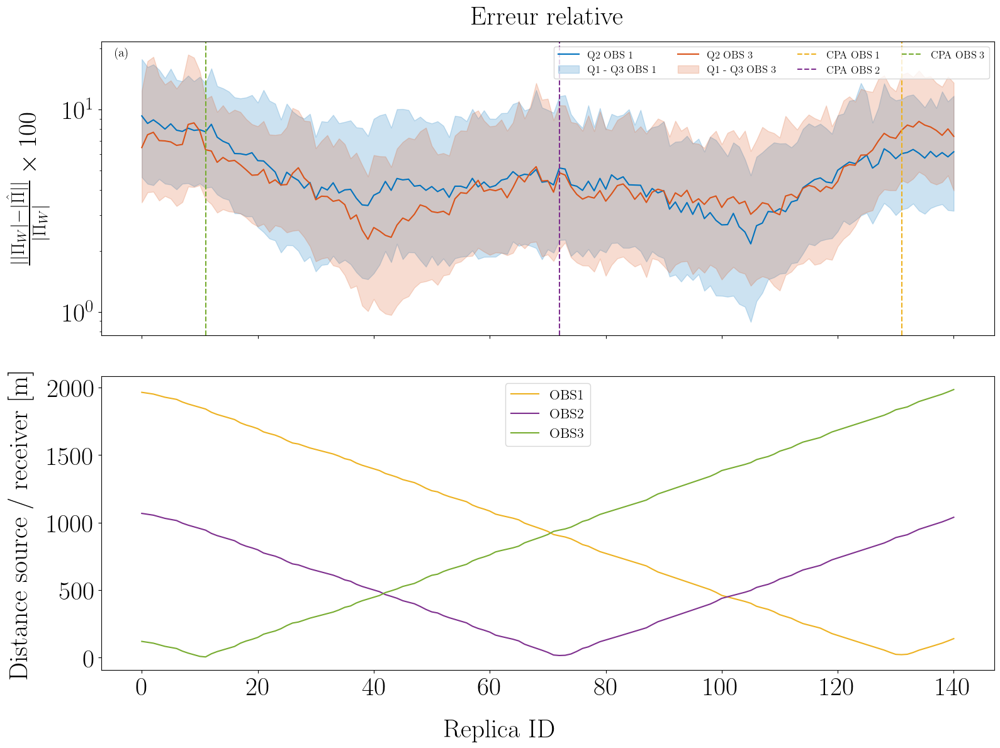

In [31]:
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, axs = plt.subplots(
    nrows=2, ncols=1, sharex=True, sharey="row", figsize=(16, 12)
)
ax_mod, ax_d = axs[0], axs[1]

for i, id_rcv in enumerate(idx_rcv_plot):

    ax_mod.plot(
        reps,
        q2_err_rel[i, :]*100,
        label=f"Q2 OBS {id_rcv}",
        color=color(i),
    )
    ax_mod.fill_between(
        reps,
        q1_err_rel[i, :]*100,
        q3_err_rel[i, :]*100,
        alpha=0.2,
        label=f"Q1 - Q3  OBS {id_rcv}",
        color=color(i),
    )

for i_rcv in range(dist_rcv.shape[0]):
    ax_mod.axvline(
        reps[obs_cpa_idx[i_rcv]],
        label=f"CPA OBS {i_rcv+1}",
        color=color(2 + i_rcv),
        linestyle="--",
    )


ax_mod.set_title(f"Erreur relative")
# ax_mod[i_ax].set_ylim([0.1, 100])
ax_mod.set_yscale("log")
ax_mod.set_xlabel("")
ax_mod.set_ylabel(
    r"$\frac{\lvert \lvert \Pi_W \rvert - \lvert \hat{\Pi} \rvert \rvert}{\lvert \Pi_W \rvert} \times 100$"
)
ax_mod.legend(fontsize=12, ncol=3, loc="upper right", ncols=4)

for i_rcv in range(dist_rcv.shape[0]):
    ax_d.plot(reps, dist_rcv[i_rcv, :], label=f"OBS{i_rcv+1}", color=color(2 + i_rcv))
# ax_d.set_xlabel("Replica ID")
ax_d.set_ylabel("Distance source / receiver [m]")
ax_d.legend()

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Replica ID")
# plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_rel_error_vs_replica_id.png")
plt.savefig(fpath)

Pour chaque rapport de fonction de transfert, le minimum d'erreur relative est atteint lorsque le SNR est élevé pour les deux capteurs composant le rapport. Ainsi, le rapport 1/2 présente une erreur minimale lorsque la source est située à mi-chemin entre l'OBS 2 et l'OBS 1. De manière analogue, le rapport 3/2 présente une erreur minimale lorsque la source est située entre l'OBS 3 et l'OBS 2. 



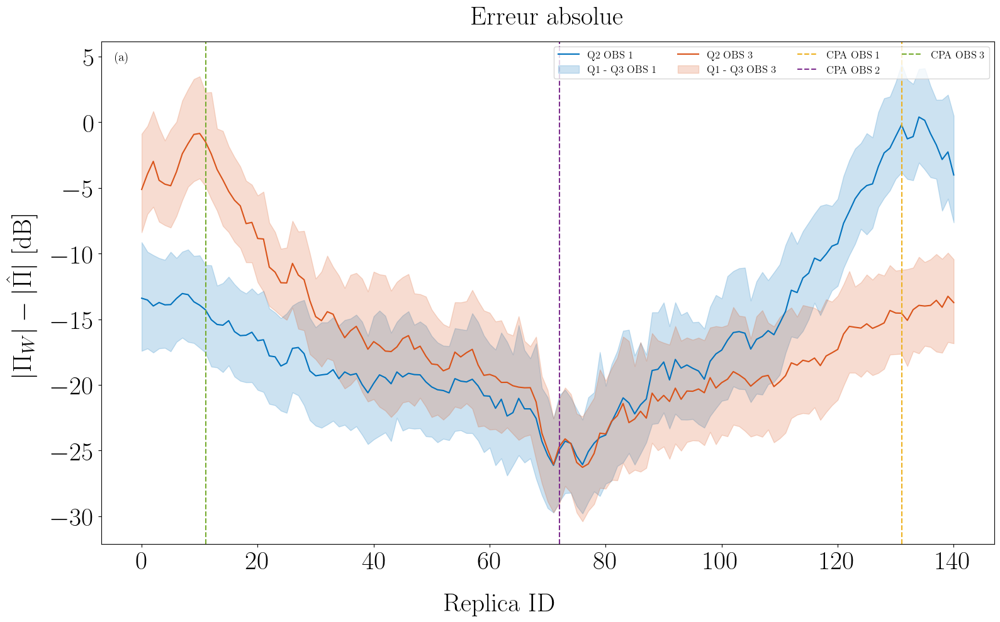

In [32]:
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_mod = plt.subplots(
    nrows=1, ncols=1, sharex=True, sharey="row", figsize=(16, 10)
)
ax_mod = np.atleast_1d(ax_mod)

for i, id_rcv in enumerate(idx_rcv_plot):

    ax_mod[0].plot(
        reps,
        10*np.log10(q2_err_abs[i, :]),
        label=f"Q2 OBS {id_rcv}",
        color=color(i),
    )
    ax_mod[0].fill_between(
        reps,
        10*np.log10(q1_err_abs[i, :]),
        10*np.log10(q3_err_abs[i, :]),
        alpha=0.2,
        label=f"Q1 - Q3  OBS {id_rcv}",
        color=color(i),
    )

for i_rcv in range(dist_rcv.shape[0]):
    ax_mod[0].axvline(
        reps[obs_cpa_idx[i_rcv]],
        label=f"CPA OBS {i_rcv+1}",
        color=color(2 + i_rcv),
        linestyle="--",
    )


ax_mod[0].set_title(f"Erreur absolue")
# ax_mod[i_ax].set_ylim([0.1, 100])
# ax_mod[0].set_yscale("log")
ax_mod[0].set_xlabel("")
ax_mod[0].set_ylabel(
    r"$\lvert \Pi_W \rvert - \lvert \hat{\Pi} \rvert$ [dB]"
)
ax_mod[0].legend(fontsize=12, ncol=3, loc="upper right", ncols=4)
set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Replica ID")
# plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_abs_error_vs_replica_id.png")
plt.savefig(fpath)

L'erreur absolue est minimal au CPA de l'OBS de référence, et ce, malgré l'erreur relative d'environ 10% observée ci-dessus. Ceci est dù aux faibles valeurs du rapport des fonctions de transfert au CPA du capteur de référence (ici le module de la fonction de transfert de référence est maximal). 

## Variations du module autour d'une réplique 

c:\Users\baptiste.menetrier\.virtualenvs\phd-FBjz4hBd\Lib\site-packages\xarray\computation\apply_ufunc.py:820: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


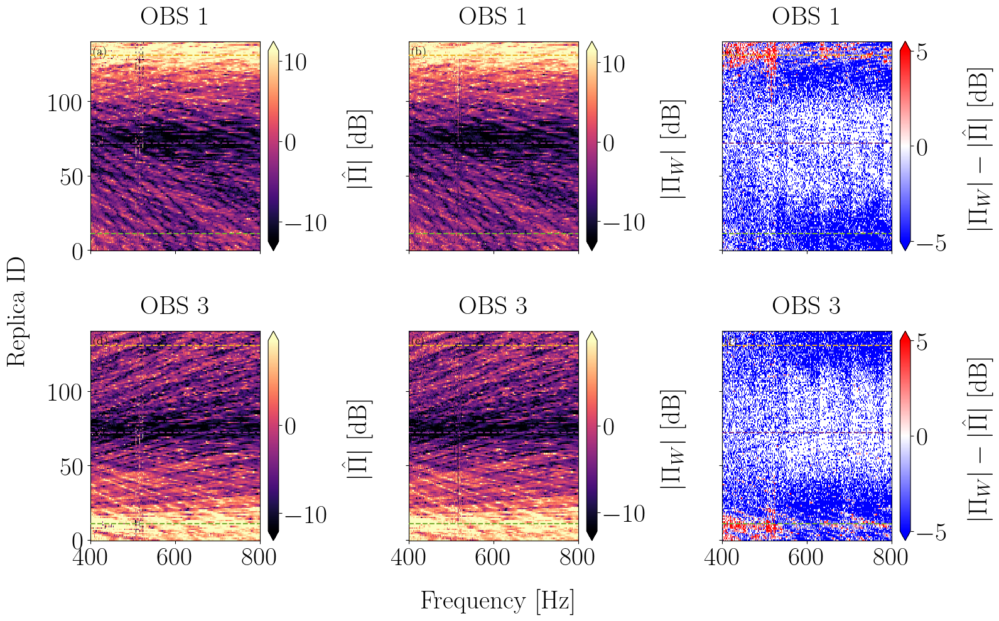

In [33]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_mod = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

replica_id_slice = slice(0, 150)

# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    log_mod = 10 * np.log10(np.abs(rtf_cs_evd_rcv))
    log_mod.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax, 0],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    log_mod = 10 * np.log10(np.abs(rtf_deconvolution_rcv))
    log_mod.plot(
        x="f_deconv",
        cmap="magma",
        ax=ax_mod[i_ax, 1],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert$ [dB]"}
    )

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop +1 
    ]
    err = np.abs(rtf_deconvolution_interp_rcv) - np.abs(rtf_cs_evd_rcv)
    log_mod = 10 * np.log10(err)
    log_mod.plot(
        x="f_rtf",
        cmap="bwr",
        ax=ax_mod[i_ax, 2],
        vmax=5,
        vmin=-5,
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert - \lvert \hat{\Pi} \rvert$ [dB]"},
    )

    for i_rcv in range(dist_rcv.shape[0]):
        for k in range(ax_mod.shape[1]):
            ax_mod[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                zorder=10,
            )

    for k in range(ax_mod.shape[1]):
        ax_mod[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_mod[i_ax, k].set_xlabel("")
        ax_mod[i_ax, k].set_ylabel("")

    #     ax_mod[i_ax].set_ylim([0.001, 1000])
    #     ax_mod[i_ax].set_yscale("log")
    #     ax_mod[i_ax].set_xlabel("")
    #     ax_mod[i_ax].set_ylabel(r"$|\Pi|$")
    #     ax_mod[i_ax].legend(fontsize=10, ncol=3, loc="upper right")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_along_traj.png")
plt.savefig(fpath)

Malgré les variations de l'erreur relative observées, les deux estimateurs présentent des structures très similaires et encodent donc la même information. En particulier, on observe un léger biais (< 5dB) entre l'estimateur par déconvolution et l'estimateur CS-EVD. 



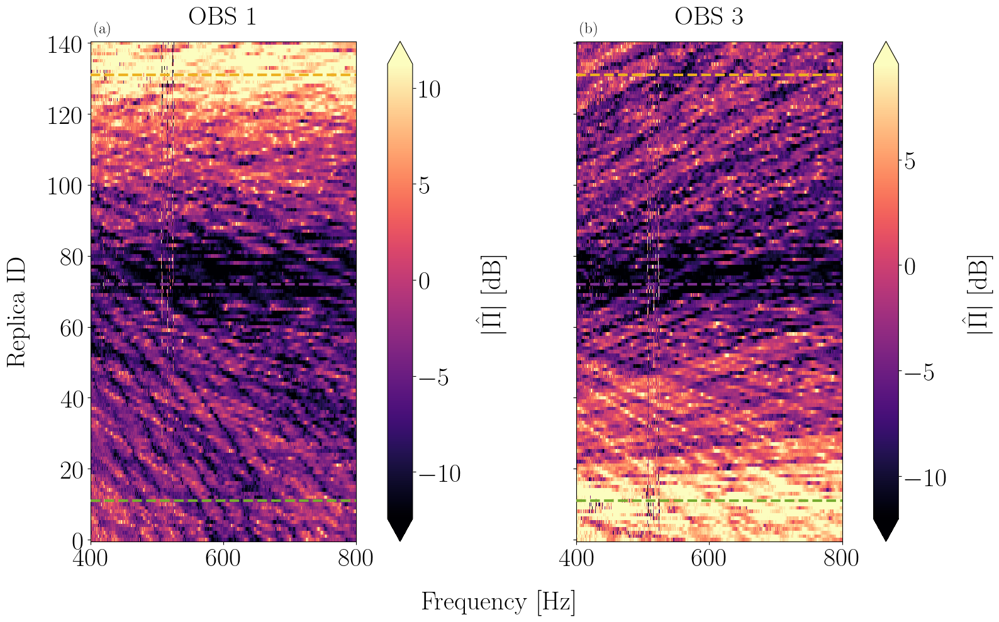

In [63]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, axs = plt.subplots(
    nrows=1, ncols=len(idx_rcv_plot), sharex=True, sharey="row", figsize=(16, 10)
)
ax_mod = axs

replica_id_slice = slice(0, 150)

# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    log_mod = 10 * np.log10(np.abs(rtf_cs_evd_rcv))
    log_mod.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )


    for i_rcv in range(dist_rcv.shape[0]):
        if (reps[obs_cpa_idx[i_rcv]] <= replica_id_slice.stop) and (
            reps[obs_cpa_idx[i_rcv]] >= replica_id_slice.start
        ):
            ax_mod[i_ax].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                linewidth=3,
                zorder=10,
            )



    ax_mod[i_ax].set_title(f"OBS {id_rcv}")
    ax_mod[i_ax].set_xlabel("")
    ax_mod[i_ax].set_ylabel("")
    i_ax += 1

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.015, y_pos=1.01, ha="left", va="bottom"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_along_traj_cs_evd.png")
plt.savefig(fpath)

### Visualisation pour chaque sous partie de la trajectoire 

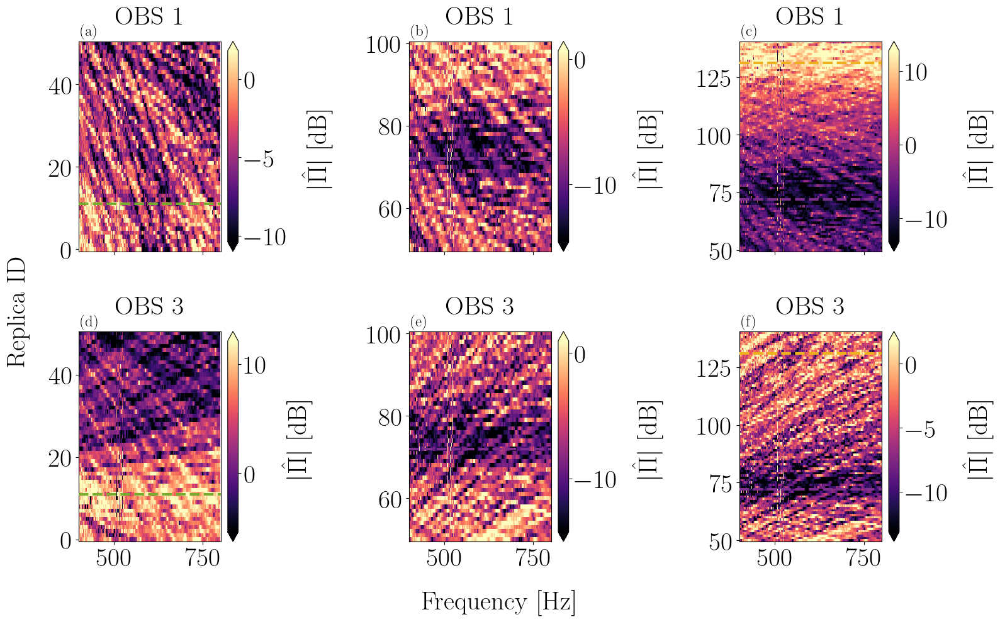

In [64]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_mod = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey=False, figsize=(16, 10)
)


replica_id_slice_0 = slice(0, 50)
replica_id_slice_1 = slice(50, 100)
replica_id_slice_2 = slice(50, 150)


# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv)

    # Slice from 0 to 50
    log_mod_0 = 10 * np.log10(np.abs(rtf_cs_evd_rcv.sel(replica_id=replica_id_slice_0)))
    log_mod_0.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax, 0],
        vmin=np.percentile(log_mod_0, 5),
        vmax=np.percentile(log_mod_0, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )

    # Slice from 50 to 100
    log_mod_1 = 10 * np.log10(np.abs(rtf_cs_evd_rcv.sel(replica_id=replica_id_slice_1)))
    log_mod_1.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax, 1],
        vmin=np.percentile(log_mod_1, 5),
        vmax=np.percentile(log_mod_1, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )

    # Slice from 50 to 150
    log_mod_2 = 10 * np.log10(np.abs(rtf_cs_evd_rcv.sel(replica_id=replica_id_slice_2)))
    log_mod_2.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax, 2],
        vmin=np.percentile(log_mod_2, 5),
        vmax=np.percentile(log_mod_2, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )

    for i_rcv in range(dist_rcv.shape[0]):
        for k in range(ax_mod.shape[1]):
            ax_mod[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                linewidth=3,
                zorder=10,
            )

    for k in range(ax_mod.shape[1]):
        ax_mod[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_mod[i_ax, k].set_xlabel("")
        ax_mod[i_ax, k].set_ylabel("")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=18, x_pos=0.015, y_pos=1.01, ha="left", va="bottom"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_along_traj_sub_slice_pannel.png")
plt.savefig(fpath)

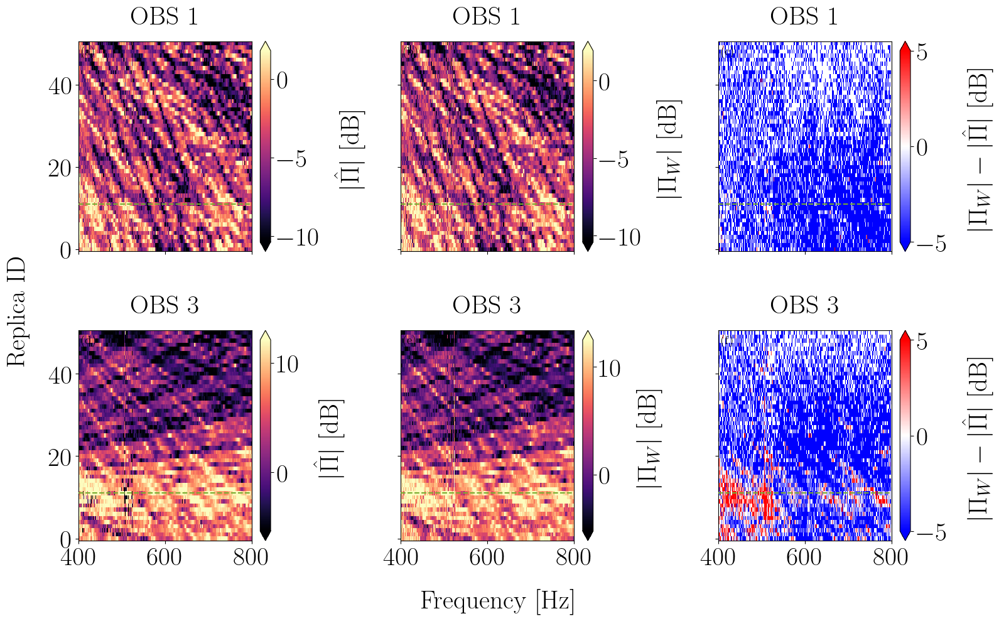

In [35]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_mod = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

# # Proche OBS 3
replica_id_slice = slice(0, 50)


# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    log_mod = 10 * np.log10(np.abs(rtf_cs_evd_rcv))
    log_mod.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax, 0],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    log_mod = 10 * np.log10(np.abs(rtf_deconvolution_rcv))
    log_mod.plot(
        x="f_deconv",
        cmap="magma",
        ax=ax_mod[i_ax, 1],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert$ [dB]"}
    )

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop +1 
    ]
    err = np.abs(rtf_deconvolution_interp_rcv) - np.abs(rtf_cs_evd_rcv)
    log_mod = 10 * np.log10(err)
    log_mod.plot(
        x="f_rtf",
        cmap="bwr",
        ax=ax_mod[i_ax, 2],
        vmax=5,
        vmin=-5,
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert - \lvert \hat{\Pi} \rvert$ [dB]"},
    )

    for i_rcv in range(dist_rcv.shape[0]):
        for k in range(ax_mod.shape[1]):
            ax_mod[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                zorder=10,
            )

    for k in range(ax_mod.shape[1]):
        ax_mod[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_mod[i_ax, k].set_xlabel("")
        ax_mod[i_ax, k].set_ylabel("")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_along_traj_0_50.png")
plt.savefig(fpath)

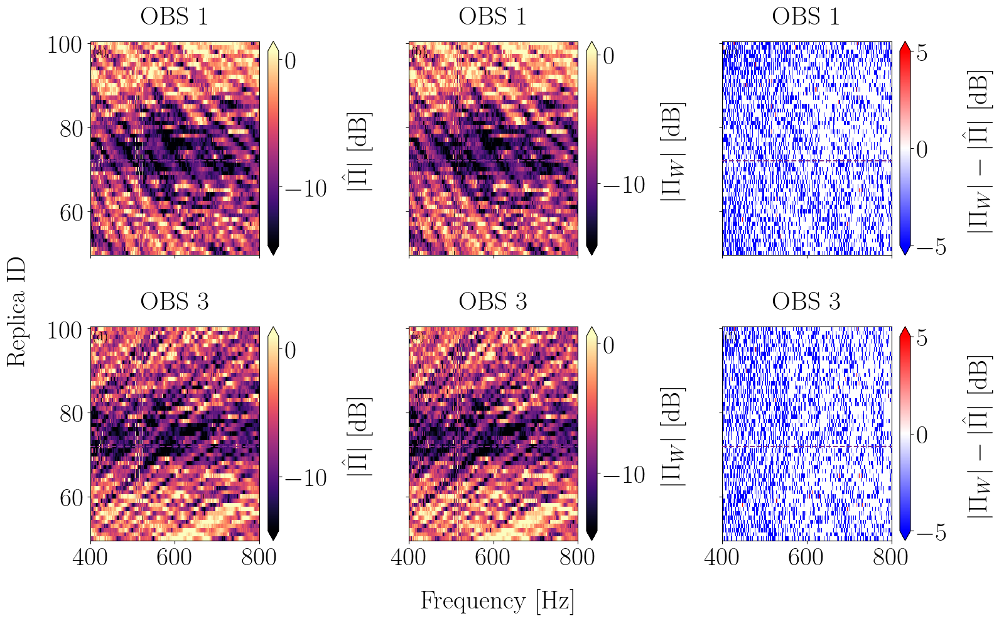

In [36]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_mod = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

# # Proche OBS 2
replica_id_slice = slice(50, 100)

# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    log_mod = 10 * np.log10(np.abs(rtf_cs_evd_rcv))
    log_mod.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax, 0],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    log_mod = 10 * np.log10(np.abs(rtf_deconvolution_rcv))
    log_mod.plot(
        x="f_deconv",
        cmap="magma",
        ax=ax_mod[i_ax, 1],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert$ [dB]"}
    )

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop +1 
    ]
    err = np.abs(rtf_deconvolution_interp_rcv) - np.abs(rtf_cs_evd_rcv)
    log_mod = 10 * np.log10(err)
    log_mod.plot(
        x="f_rtf",
        cmap="bwr",
        ax=ax_mod[i_ax, 2],
        vmax=5,
        vmin=-5,
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert - \lvert \hat{\Pi} \rvert$ [dB]"},
    )

    for i_rcv in range(dist_rcv.shape[0]):
        for k in range(ax_mod.shape[1]):
            ax_mod[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                zorder=10,
            )

    for k in range(ax_mod.shape[1]):
        ax_mod[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_mod[i_ax, k].set_xlabel("")
        ax_mod[i_ax, k].set_ylabel("")
        
    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_along_traj_50_100.png")
plt.savefig(fpath)

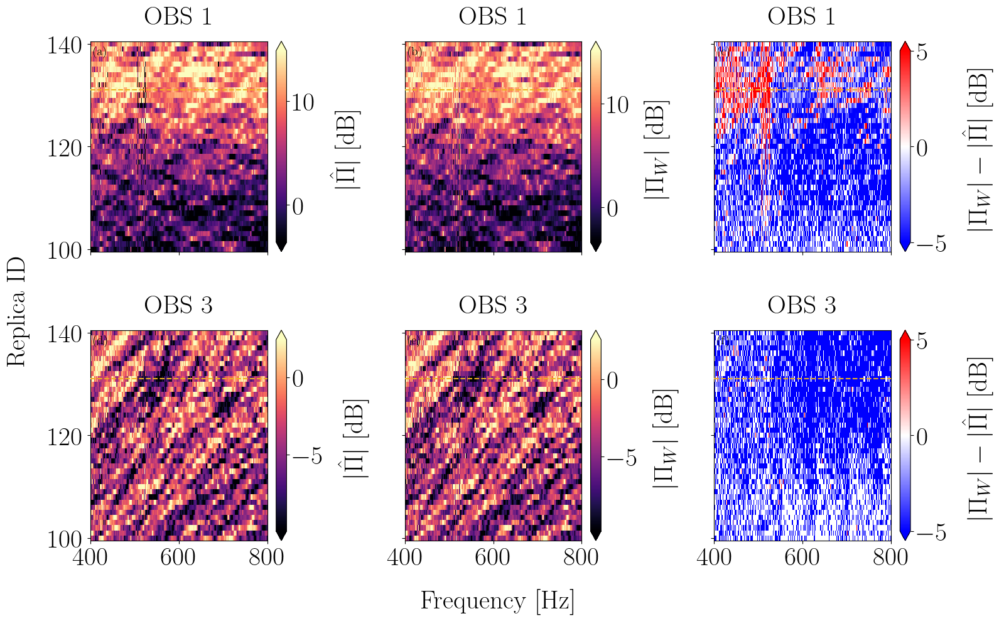

In [37]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_mod = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

# Proche OBS 1
replica_id_slice = slice(100, 150)


# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    log_mod = 10 * np.log10(np.abs(rtf_cs_evd_rcv))
    log_mod.plot(
        x="f_rtf",
        cmap="magma",
        ax=ax_mod[i_ax, 0],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \hat{\Pi} \rvert$ [dB]"},
    )

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    log_mod = 10 * np.log10(np.abs(rtf_deconvolution_rcv))
    log_mod.plot(
        x="f_deconv",
        cmap="magma",
        ax=ax_mod[i_ax, 1],
        vmin=np.percentile(log_mod, 5),
        vmax=np.percentile(log_mod, 95),
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert$ [dB]"}
    )

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop +1 
    ]
    err = np.abs(rtf_deconvolution_interp_rcv) - np.abs(rtf_cs_evd_rcv)
    log_mod = 10 * np.log10(err)
    log_mod.plot(
        x="f_rtf",
        cmap="bwr",
        ax=ax_mod[i_ax, 2],
        vmax=5,
        vmin=-5,
        cbar_kwargs={"label": r"$\lvert \Pi_W \rvert - \lvert \hat{\Pi} \rvert$ [dB]"},
    )

    for i_rcv in range(dist_rcv.shape[0]):
        for k in range(ax_mod.shape[1]):
            ax_mod[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                zorder=10,
            )

    for k in range(ax_mod.shape[1]):
        ax_mod[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_mod[i_ax, k].set_xlabel("")
        ax_mod[i_ax, k].set_ylabel("")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_module_along_traj_100_150.png")
plt.savefig(fpath)

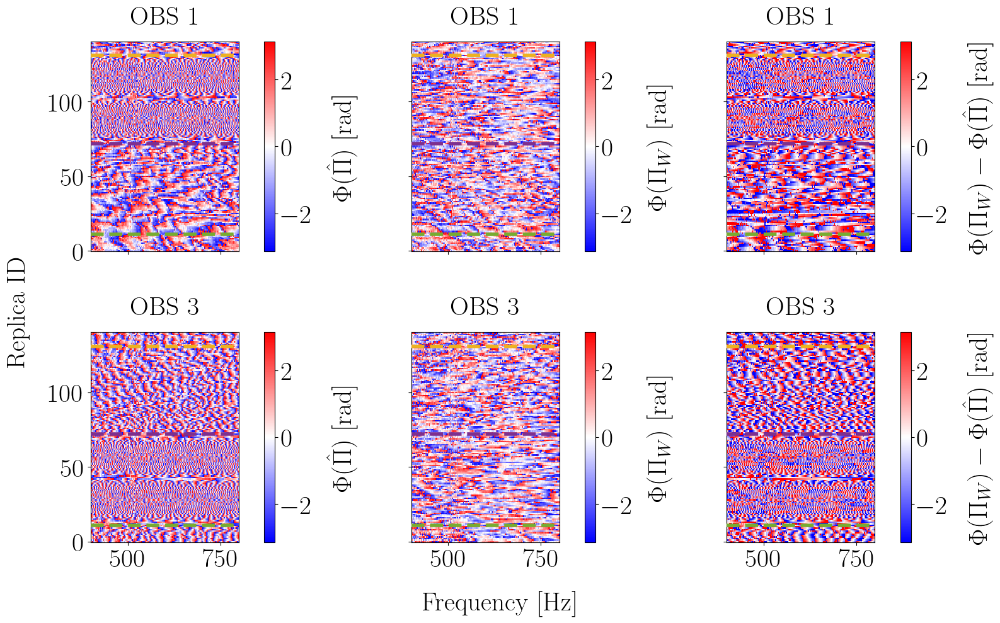

In [38]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_phase = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

replica_id_slice = slice(0, 150)
# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    phi_cs_evd = np.angle(rtf_cs_evd_rcv)
    im = ax_phase[i_ax, 0].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_cs_evd.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\hat{\Pi})$ [rad]")

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    phi = np.angle(rtf_deconvolution_rcv)
    im = ax_phase[i_ax, 1].pcolormesh(
        rtf_deconvolution_rcv.f_deconv.values,
        rtf_deconvolution_rcv.replica_id,
        phi.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W)$ [rad]")

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop + 1
    ]
    phi_err = np.angle(rtf_deconvolution_interp_rcv) - phi_cs_evd
    im = ax_phase[i_ax, 2].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_err.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W) - \Phi(\hat{\Pi})$ [rad]")

    for i_rcv in range(dist_rcv.shape[0]):
        for k in range(ax_phase.shape[1]):
            ax_phase[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                linewidth=4,
                zorder=10,
            )

    for k in range(ax_phase.shape[1]):
        ax_phase[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_phase[i_ax, k].set_xlabel("")
        ax_phase[i_ax, k].set_ylabel("")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_phase_along_traj.png")
plt.savefig(fpath)

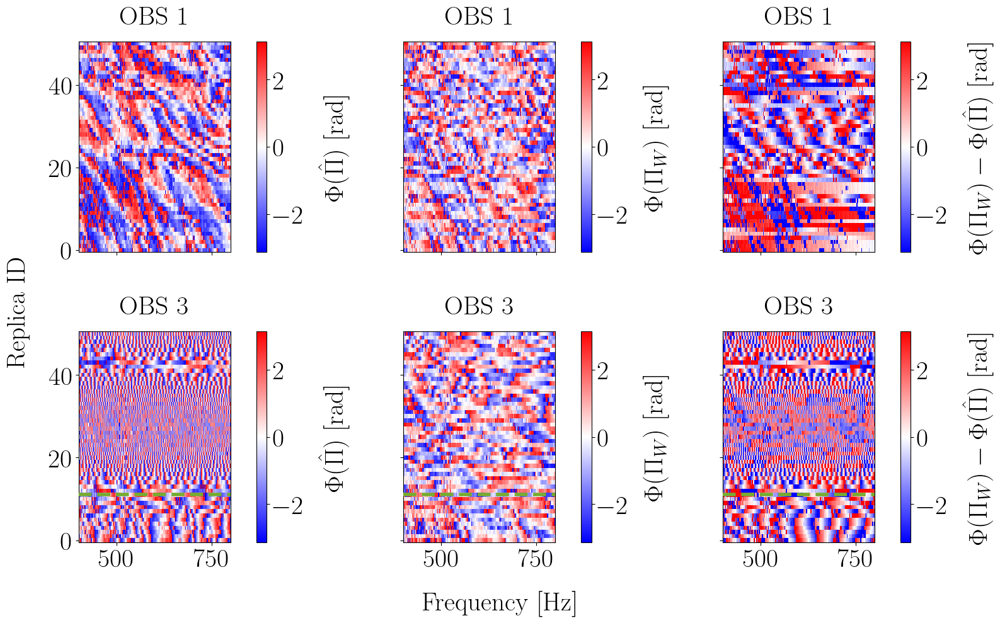

In [39]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_phase = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

replica_id_slice = slice(0, 50)
# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    phi_cs_evd = np.angle(rtf_cs_evd_rcv)
    im = ax_phase[i_ax, 0].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_cs_evd.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\hat{\Pi})$ [rad]")

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    phi = np.angle(rtf_deconvolution_rcv)
    im = ax_phase[i_ax, 1].pcolormesh(
        rtf_deconvolution_rcv.f_deconv.values,
        rtf_deconvolution_rcv.replica_id,
        phi.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W)$ [rad]")

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop + 1
    ]
    phi_err = np.angle(rtf_deconvolution_interp_rcv) - phi_cs_evd
    im = ax_phase[i_ax, 2].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_err.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W) - \Phi(\hat{\Pi})$ [rad]")

    for k in range(ax_phase.shape[1]):
        if (reps[obs_cpa_idx[i_rcv]] <= replica_id_slice.stop) and (
            reps[obs_cpa_idx[i_rcv]] >= replica_id_slice.start
        ):
            ax_phase[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                linewidth=4,
                zorder=10,
            )

    for k in range(ax_phase.shape[1]):
        ax_phase[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_phase[i_ax, k].set_xlabel("")
        ax_phase[i_ax, k].set_ylabel("")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_phase_along_traj_0_50.png")
plt.savefig(fpath)

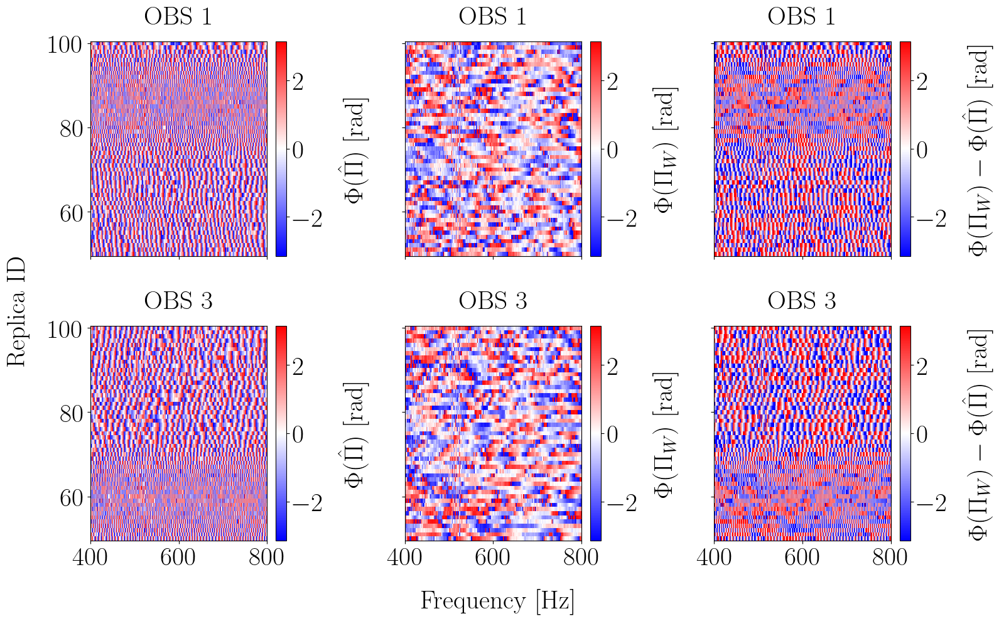

In [40]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_phase = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

replica_id_slice = slice(50, 100)
# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    phi_cs_evd = np.angle(rtf_cs_evd_rcv)
    im = ax_phase[i_ax, 0].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_cs_evd.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\hat{\Pi})$ [rad]")

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    phi = np.angle(rtf_deconvolution_rcv)
    im = ax_phase[i_ax, 1].pcolormesh(
        rtf_deconvolution_rcv.f_deconv.values,
        rtf_deconvolution_rcv.replica_id,
        phi.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W)$ [rad]")

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop + 1
    ]
    phi_err = np.angle(rtf_deconvolution_interp_rcv) - phi_cs_evd
    im = ax_phase[i_ax, 2].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_err.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W) - \Phi(\hat{\Pi})$ [rad]")

    for k in range(ax_phase.shape[1]):
        if (reps[obs_cpa_idx[i_rcv]] <= replica_id_slice.stop) and (
            reps[obs_cpa_idx[i_rcv]] >= replica_id_slice.start
        ):
            ax_phase[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                linewidth=4,
                zorder=10,
            )

    for k in range(ax_phase.shape[1]):
        ax_phase[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_phase[i_ax, k].set_xlabel("")
        ax_phase[i_ax, k].set_ylabel("")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_phase_along_traj_50_100.png")
plt.savefig(fpath)

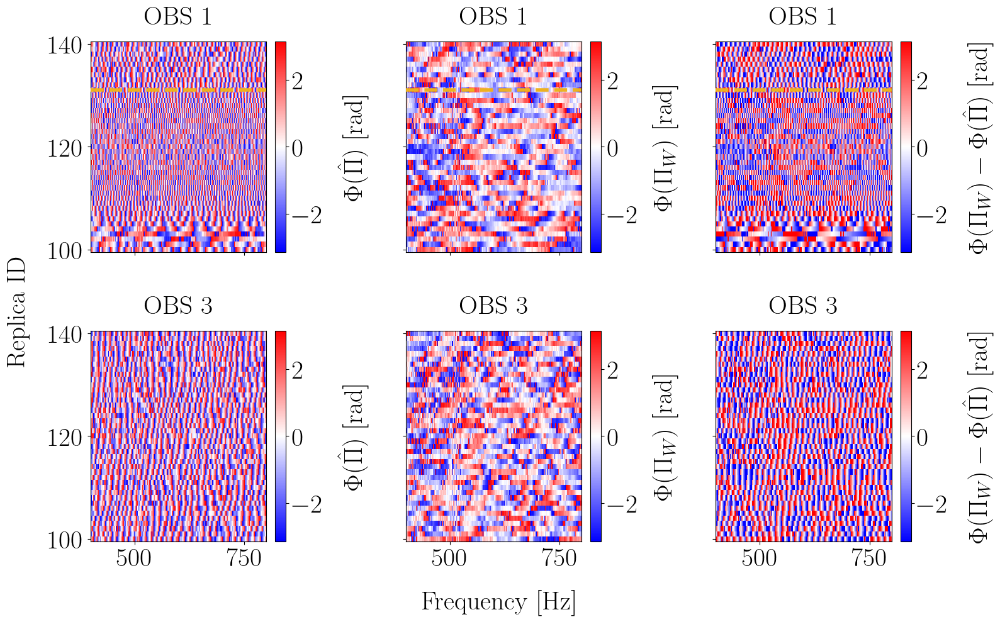

In [41]:
fmin_plot = 400
f_max_plot = 800

# rep_var_selection = [129, 130, 131, 132, 133]
n_rcv = ds.h_index.size
idx_rcv_plot = [idx for idx in ds.h_index.values if idx != ds.reference_receiver_id]

fig, ax_phase = plt.subplots(
    nrows=len(idx_rcv_plot), ncols=3, sharex=True, sharey="row", figsize=(16, 10)
)

replica_id_slice = slice(100, 150)
# Module
i_ax = 0
for id_rcv in idx_rcv_plot:
    i_rcv = np.argmin(np.abs(ds.h_index.values - id_rcv))

    rtf_cs_evd_rcv = rtf_cs_evd.sel(h_index=id_rcv).sel(replica_id=replica_id_slice)
    phi_cs_evd = np.angle(rtf_cs_evd_rcv)
    im = ax_phase[i_ax, 0].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_cs_evd.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\hat{\Pi})$ [rad]")

    rtf_deconvolution_rcv = rtf_deconvolution.sel(h_index=id_rcv).sel(
        replica_id=replica_id_slice
    )
    phi = np.angle(rtf_deconvolution_rcv)
    im = ax_phase[i_ax, 1].pcolormesh(
        rtf_deconvolution_rcv.f_deconv.values,
        rtf_deconvolution_rcv.replica_id,
        phi.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W)$ [rad]")

    rtf_deconvolution_interp_rcv = rtf_deconvolution_interp[
        i_rcv, :, replica_id_slice.start : replica_id_slice.stop + 1
    ]
    phi_err = np.angle(rtf_deconvolution_interp_rcv) - phi_cs_evd
    im = ax_phase[i_ax, 2].pcolormesh(
        rtf_cs_evd.f_rtf.values,
        rtf_cs_evd_rcv.replica_id,
        phi_err.T,
        cmap="bwr",
        vmin=-np.pi,
        vmax=np.pi,
    )
    plt.colorbar(im, label=r"$\Phi(\Pi_W) - \Phi(\hat{\Pi})$ [rad]")

    for k in range(ax_phase.shape[1]):
        if (reps[obs_cpa_idx[i_rcv]] <= replica_id_slice.stop) and (reps[
            obs_cpa_idx[i_rcv]
        ] >= replica_id_slice.start):
            ax_phase[i_ax, k].axhline(
                reps[obs_cpa_idx[i_rcv]],
                color=color(2 + i_rcv),
                label=f"CPA OBS{i_rcv+1}",
                linestyle="--",
                linewidth=4,
                zorder=10,
            )

    for k in range(ax_phase.shape[1]):
        ax_phase[i_ax, k].set_title(f"OBS {id_rcv}")
        ax_phase[i_ax, k].set_xlabel("")
        ax_phase[i_ax, k].set_ylabel("")

    i_ax += 1

set_subfigures_abc_labels(
    axs=ax_mod, fontsize=14, x_pos=0.015, y_pos=0.98, ha="left", va="top"
)
fig.supxlabel("Frequency [Hz]")
fig.supylabel("Replica ID")

# plt.xlim([fmin_plot, f_max_plot])

fpath = os.path.join(fig_folder, "rtf_phase_along_traj_100_150.png")
plt.savefig(fpath)

# Bootstrap avec la déconvolution 


In [42]:
from misc import cast_matrix_to_target_shape
def get_bootstrap_dist(ds_, test_replica_id, estimator="deconv", dist_type="hermitian_angle"):
    # Select one replica_id to compare using bootstrap
    test_replica = ds_.sel(replica_id=test_replica_id)
    # Remove from the rest of the features for bootstraping
    # bootstrap_replica = ds.drop_sel(replica_id=test_replica_id)
    bootstrap_replica = ds_

    if estimator == "deconv":
        # Test RTF
        test_replica_rtf = test_replica.rtf_amp_deconv * np.exp(
            1j * test_replica.rtf_phase_deconv
        )

        # Other RTFs
        bootstrap_replica_rtfs = bootstrap_replica.rtf_amp_deconv * np.exp(
            1j * bootstrap_replica.rtf_phase_deconv
        )
    elif estimator == "cs-evd":
        # Test RTF
        test_replica_rtf = test_replica.rtf_amp * np.exp(1j * test_replica.rtf_phase)

        # Other RTFs
        bootstrap_replica_rtfs = bootstrap_replica.rtf_amp * np.exp(
            1j * bootstrap_replica.rtf_phase
        )

    # Reshape to 4D array to be able to apply distance function : (n_rcv, n_freq, n_segment_dt) -> (n_rcv, n_freq, n_segment_dt, 1)
    bootstrap_replica_rtfs = bootstrap_replica_rtfs.values[..., np.newaxis]

    # # Compute dist
    if dist_type == "hermitian_angle":
        dist_kwargs = {"ax_rcv": 0, "ax_f": 1, "apply_mean": False, "apply_median": True}
        dist = D_hermitian_angle_fast(
            rtf_ref=test_replica_rtf.values,
            rtf=bootstrap_replica_rtfs,
            **dist_kwargs,
        )

    # Distance module
    elif dist_type == "hermitian_angle_module":
        rtf_ref = np.abs(test_replica_rtf.values)
        rtf = np.abs(bootstrap_replica_rtfs)

        dist_kwargs = {"ax_rcv": 0, "ax_f": 1, "apply_mean": False, "apply_median": True, "data_space": "real"}
        dist = D_hermitian_angle_fast(
            rtf_ref=rtf_ref,
            rtf=rtf,
            **dist_kwargs,
        )

    elif dist_type == "norm_L1":
        rtf_ref = test_replica_rtf.values
        rtf = bootstrap_replica_rtfs
        rtf_ref_expanded = cast_matrix_to_target_shape(rtf_ref, rtf.shape)

        d_L1 = np.sum(np.abs(rtf_ref_expanded - rtf), axis=0)
        dist = np.median(d_L1, axis=0).squeeze()  # Median along f axis

    elif dist_type == "norm_L1_module":
        rtf_ref = np.abs(test_replica_rtf.values)
        rtf = np.abs(bootstrap_replica_rtfs)
        rtf_ref_expanded = cast_matrix_to_target_shape(rtf_ref, rtf.shape)

        d_L1_mod = np.sum(np.abs(rtf_ref_expanded - rtf), axis=0)
        dist = np.median(d_L1_mod, axis=0).squeeze()  # Median along f axis

    return dist 

In [43]:
def get_bootstrap_dist_matrix(ds_, estimator="cs-evd", dist_type="hermitian_angle"):
    dist_mat = []
    for i, id in enumerate(ds_.replica_id.values): 
        dist_id = get_bootstrap_dist(
            ds_=ds_, test_replica_id=id, estimator=estimator, dist_type=dist_type
        )
        # dist_id = np.concatenate([dist_id[0:i], np.array([0]), dist_id[i:]])       # Add 0 on diagonal
        dist_mat.append(dist_id)

    dist_mat = np.array(dist_mat)
    return dist_mat

In [44]:
def build_dist_matrix(ds):
    e = ds["e_replica"].values
    n = ds["n_replica"].values

    rep_pos = np.column_stack((e, n))
    spatial_dist = cdist(rep_pos, rep_pos, metric="euclidean")

    return spatial_dist

In [45]:
cpa_idx = obs_cpa_idx

In [46]:
spatial_dist_mat = build_dist_matrix(ds)

In [47]:
theta_mat_deconv = get_bootstrap_dist_matrix(
    ds_=ds, estimator="deconv", dist_type="hermitian_angle"
)

theta_mat = get_bootstrap_dist_matrix(
    ds_=ds, estimator="cs-evd", dist_type="hermitian_angle"
)

theta_mat_deconv_mod = get_bootstrap_dist_matrix(
    ds_=ds, estimator="deconv", dist_type="hermitian_angle_module"
)

theta_mat_mod = get_bootstrap_dist_matrix(
    ds_=ds, estimator="cs-evd", dist_type="hermitian_angle_module"
)

In [48]:
L1_mat_deconv = get_bootstrap_dist_matrix(
    ds_=ds, estimator="deconv", dist_type="norm_L1"
)

L1_mat = get_bootstrap_dist_matrix(
    ds_=ds, estimator="cs-evd", dist_type="norm_L1"
)

L1_mat_deconv_mod = get_bootstrap_dist_matrix(
    ds_=ds, estimator="deconv", dist_type="norm_L1_module"
)

L1_mat_mod = get_bootstrap_dist_matrix(
    ds_=ds, estimator="cs-evd", dist_type="norm_L1_module"
)

### Full comparaison

In [49]:
i_ls = [40, 80, 120]

#### Norme L1

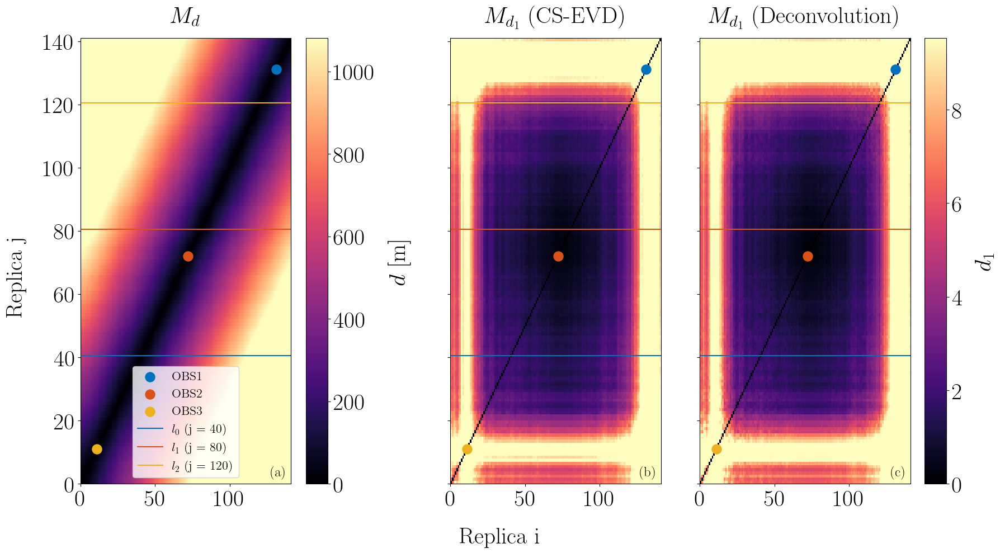

In [50]:
# Quelques lignes à la loupe

fig, axs = plt.subplots(
    nrows=1, ncols=3, sharey=True, figsize=(18, 10), constrained_layout=True
)
ax1, ax2, ax3 = axs

vmax = np.nanpercentile(spatial_dist_mat, 75)
im = ax1.pcolormesh(spatial_dist_mat, cmap="magma", vmax=vmax)
# fig.colorbar(im, ax=ax1, orientation="vertical", label=r"$d$ [m]")
ax1.set_title(r"$M_{d}$")

clabel = r"$d$ [m]"
fig.colorbar(
    im,
    ax=[ax1],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.07,
)

vmax = min(np.nanpercentile(L1_mat, 75), np.nanpercentile(L1_mat_deconv, 75))

im = ax2.pcolormesh(L1_mat, cmap="magma", vmax=vmax)
ax2.set_title(r"$M_{d_1}$ (CS-EVD)")

im = ax3.pcolormesh(L1_mat_deconv, cmap="magma", vmax=vmax)
ax3.set_title(r"$M_{d_1}$ (Deconvolution)")

clabel = r"$d_1$"
fig.colorbar(
    im,
    ax=[ax2, ax3],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.03,
    
)

fig.supxlabel("Replica i")
fig.supylabel("Replica j")

# Add CPA indication and lines
for ax in axs:
    for i, i_rcv in enumerate(ds.h_index.values):
        ax.scatter(
            cpa_idx[i],
            cpa_idx[i],
            marker="o",
            s=150,
            color=color(i),
            label=f"OBS{i_rcv}",
        )

    for k, i_l in enumerate(i_ls):
        ax.axhline(i_l + 0.5, color=color(k), label=rf"$l_{k}$ (j = {i_l})")

ax1.legend()

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.98, y_pos=0.01, ha="right", va="bottom"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_dL1_cs_evd_deconv.png",
)

plt.savefig(fpath)

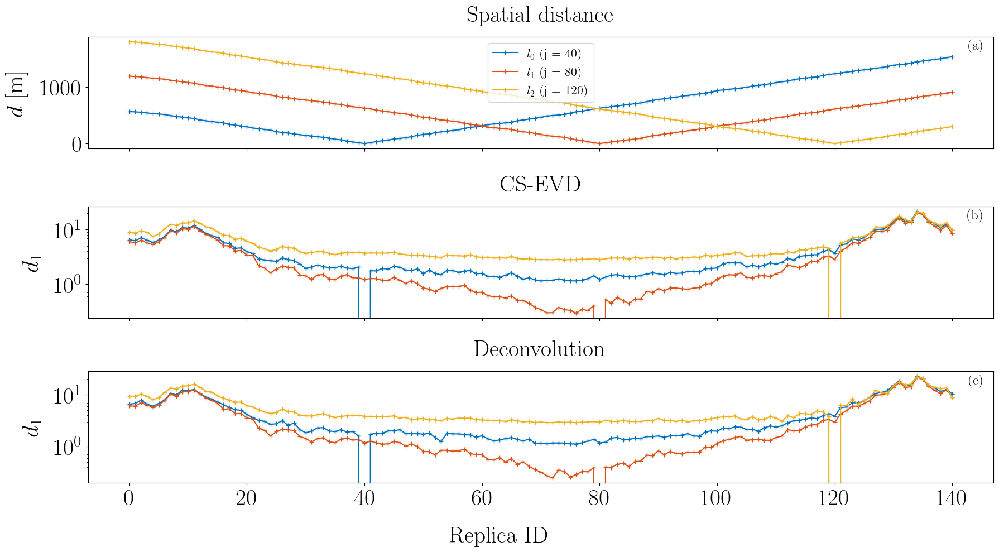

In [51]:
fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(18, 10))
ax1, ax2, ax3 = axs

for k, i_l in enumerate(i_ls):
    ax1.plot(
        spatial_dist_mat[i_l, :],
        marker="+",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax2.plot(
        L1_mat[i_l, :],
        marker="+",
        linestyle="-",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax3.plot(
        L1_mat_deconv[i_l, :], marker="+", linestyle="-", color=color(k), label=rf"$l_{k}$ (j = {i_l})"
    )

ax1.set_ylabel(r"$d$ [m]")
ax2.set_ylabel(r"$d_1$")
ax3.set_ylabel(r"$d_1$")

ax1.set_title("Spatial distance")
ax2.set_title("CS-EVD")
ax3.set_title("Deconvolution")

ax2.set_yscale("log")
ax3.set_yscale("log")

ax1.legend()
# ax2.legend()
fig.supxlabel("Replica ID")

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.99, y_pos=0.98, ha="right", va="top"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_dL1_mod_selected_lines_var.png",
)

plt.savefig(fpath)

#### Norme L1 module 

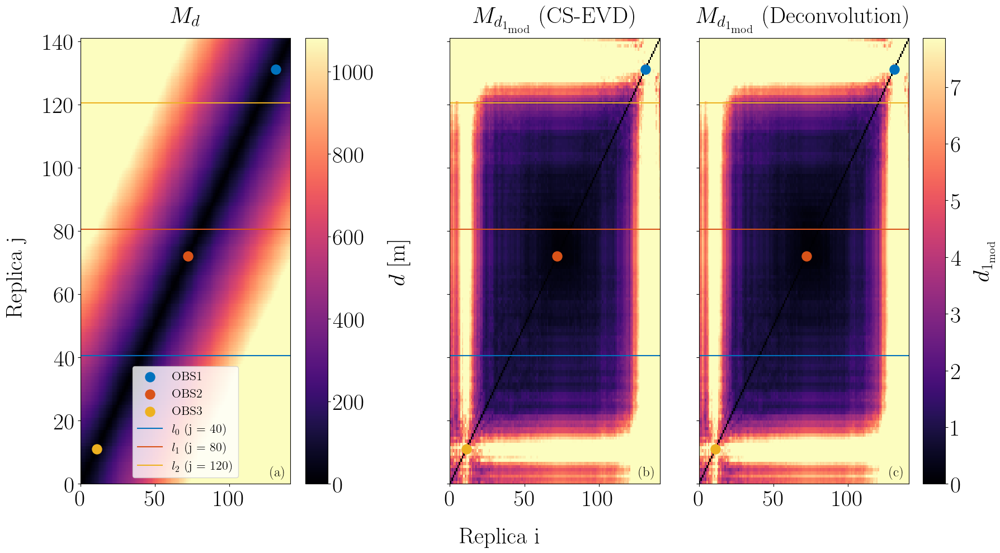

In [52]:
# Quelques lignes à la loupe

fig, axs = plt.subplots(
    nrows=1, ncols=3, sharey=True, figsize=(18, 10), constrained_layout=True
)
ax1, ax2, ax3 = axs

vmax = np.nanpercentile(spatial_dist_mat, 75)
im = ax1.pcolormesh(spatial_dist_mat, cmap="magma", vmax=vmax)
# fig.colorbar(im, ax=ax1, orientation="vertical", label=r"$d$ [m]")
ax1.set_title(r"$M_{d}$")

clabel = r"$d$ [m]"
fig.colorbar(
    im,
    ax=[ax1],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.07,
)

vmax = min(np.nanpercentile(L1_mat_mod, 75), np.nanpercentile(L1_mat_deconv_mod, 75))

im = ax2.pcolormesh(L1_mat_mod, cmap="magma", vmax=vmax)
ax2.set_title(r"$M_{d_{1_\text{mod}}}$ (CS-EVD)")

im = ax3.pcolormesh(L1_mat_deconv_mod, cmap="magma", vmax=vmax)
ax3.set_title(r"$M_{d_{1_\text{mod}}}$ (Deconvolution)")

clabel = r"$d_{1_\text{mod}}$"
fig.colorbar(
    im,
    ax=[ax2, ax3],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.03,
    
)

fig.supxlabel("Replica i")
fig.supylabel("Replica j")

# Add CPA indication and lines
for ax in axs:
    for i, i_rcv in enumerate(ds.h_index.values):
        ax.scatter(
            cpa_idx[i],
            cpa_idx[i],
            marker="o",
            s=150,
            color=color(i),
            label=f"OBS{i_rcv}",
        )

    for k, i_l in enumerate(i_ls):
        ax.axhline(i_l + 0.5, color=color(k), label=rf"$l_{k}$ (j = {i_l})")

ax1.legend()

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.98, y_pos=0.01, ha="right", va="bottom"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_dL1_mod_cs_evd_deconv.png",
)

plt.savefig(fpath)

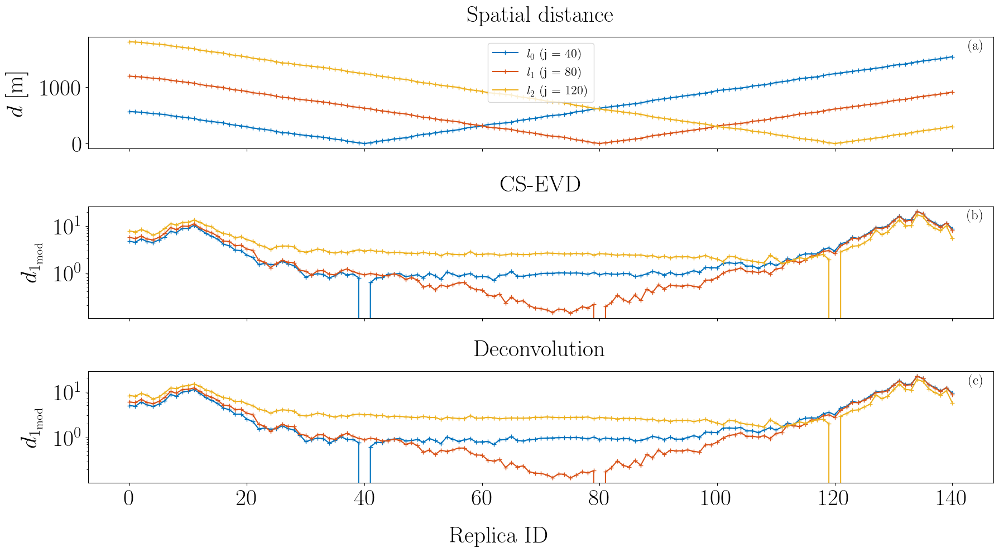

In [53]:
fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(18, 10))
ax1, ax2, ax3 = axs

for k, i_l in enumerate(i_ls):
    ax1.plot(
        spatial_dist_mat[i_l, :],
        marker="+",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax2.plot(
        L1_mat_mod[i_l, :],
        marker="+",
        linestyle="-",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax3.plot(
        L1_mat_deconv_mod[i_l, :], marker="+", linestyle="-", color=color(k), label=rf"$l_{k}$ (j = {i_l})"
    )

ax1.set_ylabel(r"$d$ [m]")
ax2.set_ylabel(r"$d_{1_\text{mod}}$")
ax3.set_ylabel(r"$d_{1_\text{mod}}$")

ax1.set_title("Spatial distance")
ax2.set_title("CS-EVD")
ax3.set_title("Deconvolution")

# ax1.set_xlim()
# ax2.set_ylim([0, vmax])
# ax3.set_ylim([0, vmax])

ax2.set_yscale("log")
ax3.set_yscale("log")


ax1.legend()
# ax2.legend()
fig.supxlabel("Replica ID")

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.99, y_pos=0.98, ha="right", va="top"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_dL1_module_selected_lines_var.png",
)

plt.savefig(fpath)

#### Angle hermitien

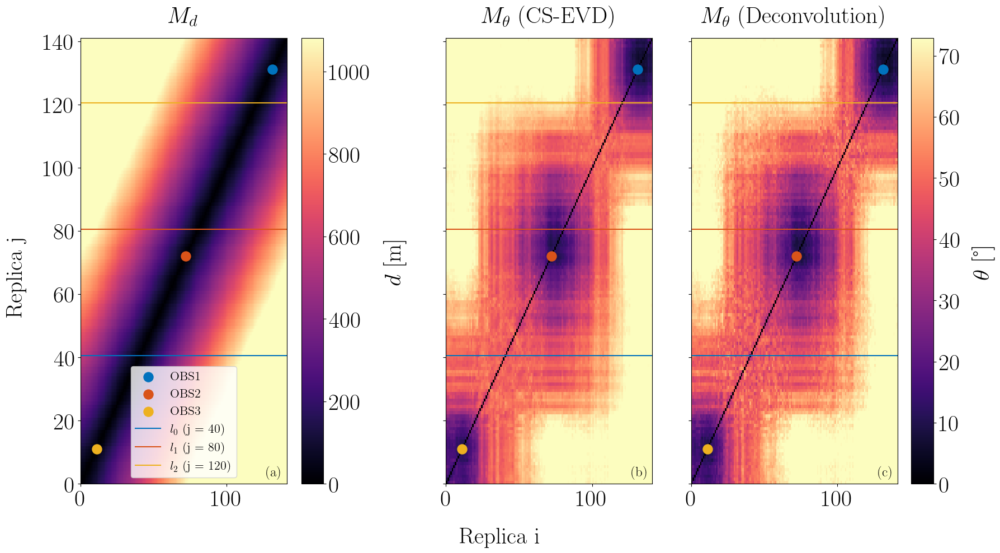

In [54]:
# Quelques lignes à la loupe
fig, axs = plt.subplots(
    nrows=1, ncols=3, sharey=True, figsize=(18, 10), constrained_layout=True
)
ax1, ax2, ax3 = axs

vmax = np.nanpercentile(spatial_dist_mat, 75)
im = ax1.pcolormesh(spatial_dist_mat, cmap="magma", vmax=vmax)
# fig.colorbar(im, ax=ax1, orientation="vertical", label=r"$d$ [m]")
ax1.set_title(r"$M_{d}$")

clabel = r"$d$ [m]"
fig.colorbar(
    im,
    ax=[ax1],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.07,
)

vmax = min(np.nanpercentile(theta_mat, 75), np.nanpercentile(theta_mat_deconv, 75))

im = ax2.pcolormesh(theta_mat, cmap="magma", vmax=vmax)
ax2.set_title(r"$M_{\theta}$ (CS-EVD)")

im = ax3.pcolormesh(theta_mat_deconv, cmap="magma", vmax=vmax)
ax3.set_title(r"$M_{\theta}$ (Deconvolution)")

clabel = r"$\theta$ [°]"
fig.colorbar(
    im,
    ax=[ax2, ax3],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.03,
    
)

fig.supxlabel("Replica i")
fig.supylabel("Replica j")

# Add CPA indication and lines
for ax in axs:
    for i, i_rcv in enumerate(ds.h_index.values):
        ax.scatter(
            cpa_idx[i],
            cpa_idx[i],
            marker="o",
            s=150,
            color=color(i),
            label=f"OBS{i_rcv}",
        )

    for k, i_l in enumerate(i_ls):
        ax.axhline(i_l + 0.5, color=color(k), label=rf"$l_{k}$ (j = {i_l})")

ax1.legend()

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.98, y_pos=0.01, ha="right", va="bottom"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_theta_cs_evd_deconv.png",
)

plt.savefig(fpath)

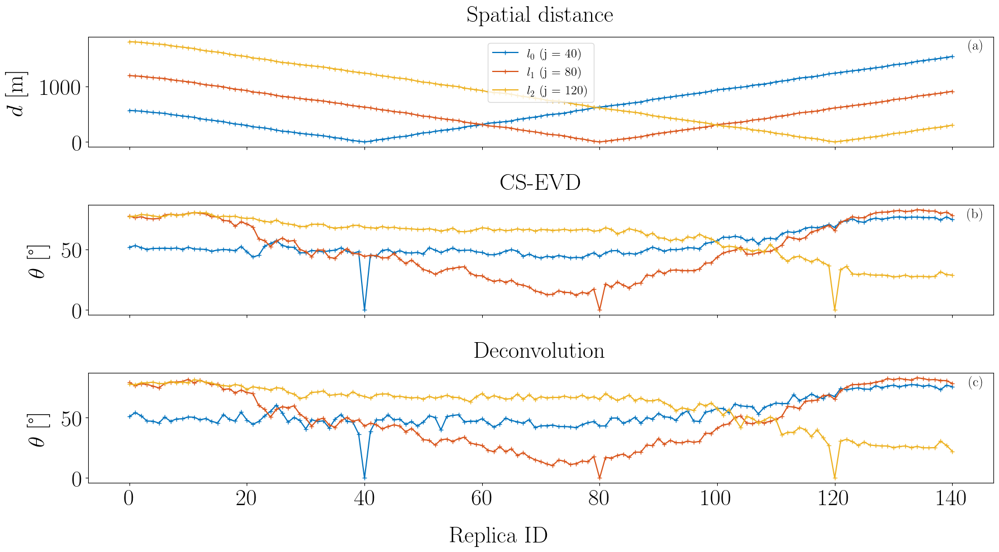

In [55]:
fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(18, 10))
ax1, ax2, ax3 = axs

for k, i_l in enumerate(i_ls):
    ax1.plot(
        spatial_dist_mat[i_l, :],
        marker="+",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax2.plot(
        theta_mat[i_l, :],
        marker="+",
        linestyle="-",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax3.plot(
        theta_mat_deconv[i_l, :], marker="+", linestyle="-", color=color(k), label=rf"$l_{k}$ (j = {i_l})"
    )

ax1.set_ylabel(r"$d$ [m]")
ax2.set_ylabel(r"$\theta$ [°]")
ax3.set_ylabel(r"$\theta$ [°]")

ax1.set_title("Spatial distance")
ax2.set_title("CS-EVD")
ax3.set_title("Deconvolution")

ax1.legend()
# ax2.legend()
fig.supxlabel("Replica ID")

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.99, y_pos=0.98, ha="right", va="top"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_theta_selected_lines_var.png",
)

plt.savefig(fpath)

#### Angle hermitien module 

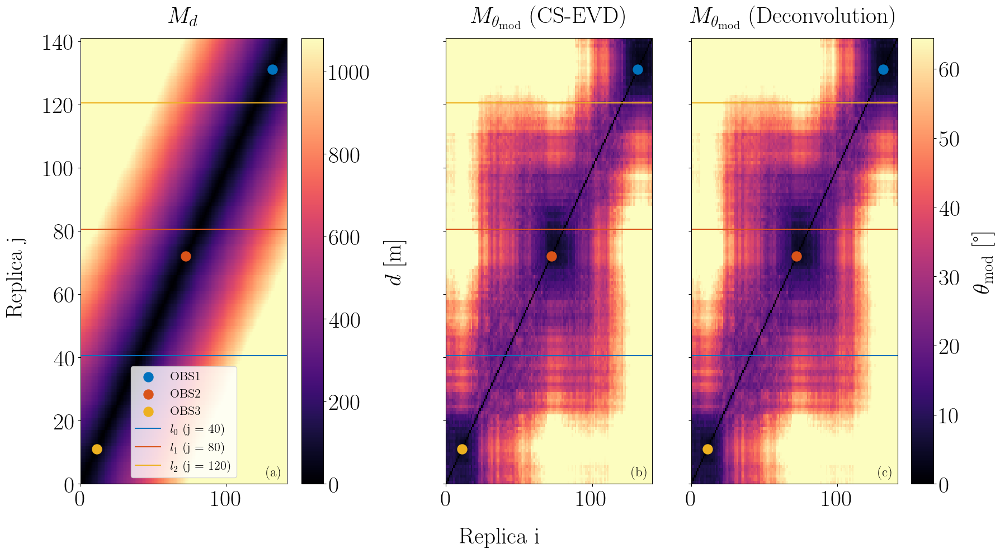

In [56]:
# Quelques lignes à la loupe
fig, axs = plt.subplots(
    nrows=1, ncols=3, sharey=True, figsize=(18, 10), constrained_layout=True
)
ax1, ax2, ax3 = axs

vmax = np.nanpercentile(spatial_dist_mat, 75)
im = ax1.pcolormesh(spatial_dist_mat, cmap="magma", vmax=vmax)
# fig.colorbar(im, ax=ax1, orientation="vertical", label=r"$d$ [m]")
ax1.set_title(r"$M_{d}$")

clabel = r"$d$ [m]"
fig.colorbar(
    im,
    ax=[ax1],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.07,
)

vmax = min(np.nanpercentile(theta_mat_mod, 75), np.nanpercentile(theta_mat_deconv_mod, 75))

im = ax2.pcolormesh(theta_mat_mod, cmap="magma", vmax=vmax)
ax2.set_title(r"$M_{\theta_{\text{mod}}}$ (CS-EVD)")

im = ax3.pcolormesh(theta_mat_deconv_mod, cmap="magma", vmax=vmax)
ax3.set_title(r"$M_{\theta_{\text{mod}}}$ (Deconvolution)")


clabel = r"$\theta_{\text{mod}}$ [°]"
fig.colorbar(
    im,
    ax=[ax2, ax3],
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.03,
)

fig.supxlabel("Replica i")
fig.supylabel("Replica j")

# Add CPA indication and lines
for ax in axs:
    for i, i_rcv in enumerate(ds.h_index.values):
        ax.scatter(
            cpa_idx[i],
            cpa_idx[i],
            marker="o",
            s=150,
            color=color(i),
            label=f"OBS{i_rcv}",
        )

    for k, i_l in enumerate(i_ls):
        ax.axhline(i_l + 0.5, color=color(k), label=rf"$l_{k}$ (j = {i_l})")

ax1.legend()
# ax2.legend()

set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.98, y_pos=0.01, ha="right", va="bottom"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_theta_mod_cs_evd_deconv.png",
)

plt.savefig(fpath)

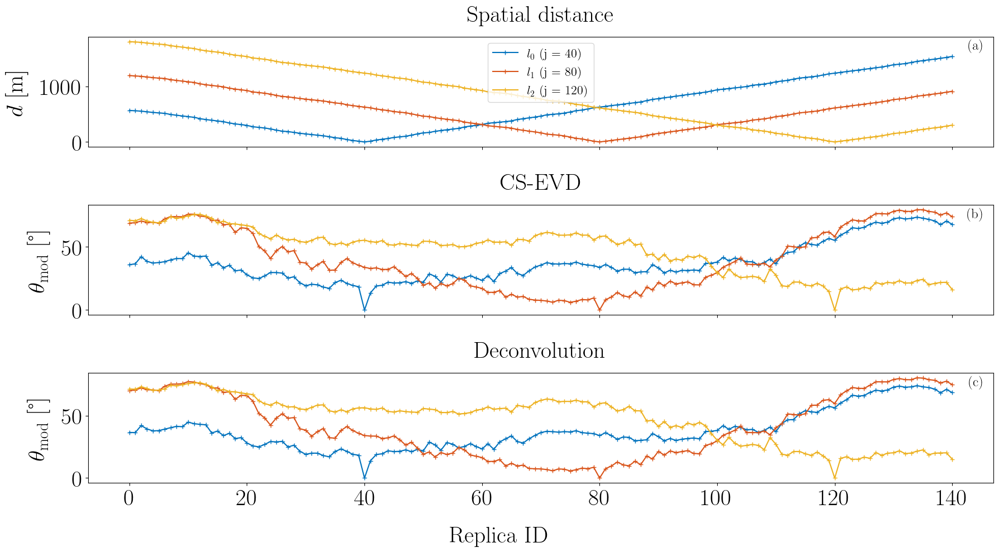

In [57]:
fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(18, 10))
ax1, ax2, ax3 = axs

for k, i_l in enumerate(i_ls):
    ax1.plot(
        spatial_dist_mat[i_l, :],
        marker="+",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax2.plot(
        theta_mat_mod[i_l, :],
        marker="+",
        linestyle="-",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )
    ax3.plot(
        theta_mat_deconv_mod[i_l, :],
        marker="+",
        linestyle="-",
        color=color(k),
        label=rf"$l_{k}$ (j = {i_l})",
    )

ax1.set_ylabel(r"$d$ [m]")
ax2.set_ylabel(r"$\theta_\text{mod}$ [°]")
ax3.set_ylabel(r"$\theta_\text{mod}$ [°]")

ax1.set_title("Spatial distance")
ax2.set_title("CS-EVD")
ax3.set_title("Deconvolution")

ax1.legend()
# ax2.legend()
fig.supxlabel("Replica ID")


set_subfigures_abc_labels(
    axs=axs, fontsize=18, x_pos=0.99, y_pos=0.98, ha="right", va="top"
)

fpath = os.path.join(
    fig_folder,
    f"bootstrap_theta_module_selected_lines_var.png",
)

plt.savefig(fpath)